The watermark extension is already loaded. To reload it, use:
  %reload_ext watermark
starry version: 1.0.1.dev188+g9c4e1076
Last updated: Wed May 12 2021

Python implementation: CPython
Python version       : 3.7.6
IPython version      : 7.12.0

matplotlib: 3.3.4
starry    : 1.0.1.dev188+g9c4e1076
corner    : 2.0.1
pandas    : 1.2.2
theano    : 1.0.4
exoplanet : 0.3.2
astropy   : 4.0
pymc3     : 3.8
seaborn   : 0.11.0
arviz     : 0.10.0
numpy     : 1.20.1

Watermark: 2.2.0



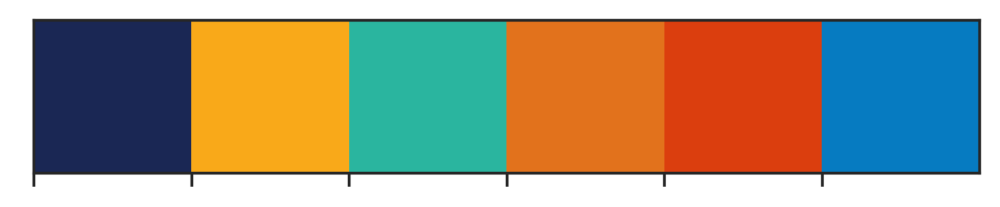

In [72]:
%config InlineBackend.figure_format = "retina"
%load_ext watermark

import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt

import starry
starry.config.lazy = True
starry.config.quiet = True
print('starry version:', starry.__version__)

import time as timer
import pandas as pd

import arviz as az
import pymc3 as pm
import exoplanet as xo
import theano.tensor as tt
import astropy.units as u
import astropy.constants as c

import corner
from sklearn.neighbors import KernelDensity

from astropy.time import Time

import seaborn as sns

sns.set_theme(context='paper', 
              style='ticks', 
#              palette='colorblind', 
              font='sans-serif', 
              font_scale=1.2)

sns.set_palette(['#1a2754','#f9a919','#2ab59f','#e2721c','#db3e0e','#067bc1'])
sns.palplot(['#1a2754','#f9a919','#2ab59f','#e2721c','#db3e0e','#067bc1'])


mpl.rcParams['figure.dpi'] = 150
mpl.rcParams['figure.figsize'] = 4,3
mpl.rcParams['legend.fancybox'] = False


%watermark -n -u -v -iv -w

# from astropy.io import fits
# from scipy.signal import savgol_filter

In [62]:
#Stellar parameters
M_star = 1.10, 0.05
R_star = 1.305, 0.07

V1298 = {'per': [24.141445, 0.000056],
         't0': [2454833.0+2234.046461, 0.002141],
         'tmid': [2458781.08691, 0.005824],
         'rprs': [0.0700, 0.0023],
         'vsini': [25.24, 1], 
         'prot': [2.865, 0.012],
         'mstar': [1.10, 0.05],
         'rstar': [1.305, 0.070],
         'mp': 1e-5,
         'ecc': 0.,
         'omega': 90.,
         'ip': [89.0,0.5],
         't14': 6.42/24.0}

#We subtract a constant time offset from all observations, to be added back in at the end
time_offset = V1298['t0'][0]+71.*V1298['per'][0]

/Users/tdavid/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:51: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


Median RV exposure time [minutes]: 5.480832606554031


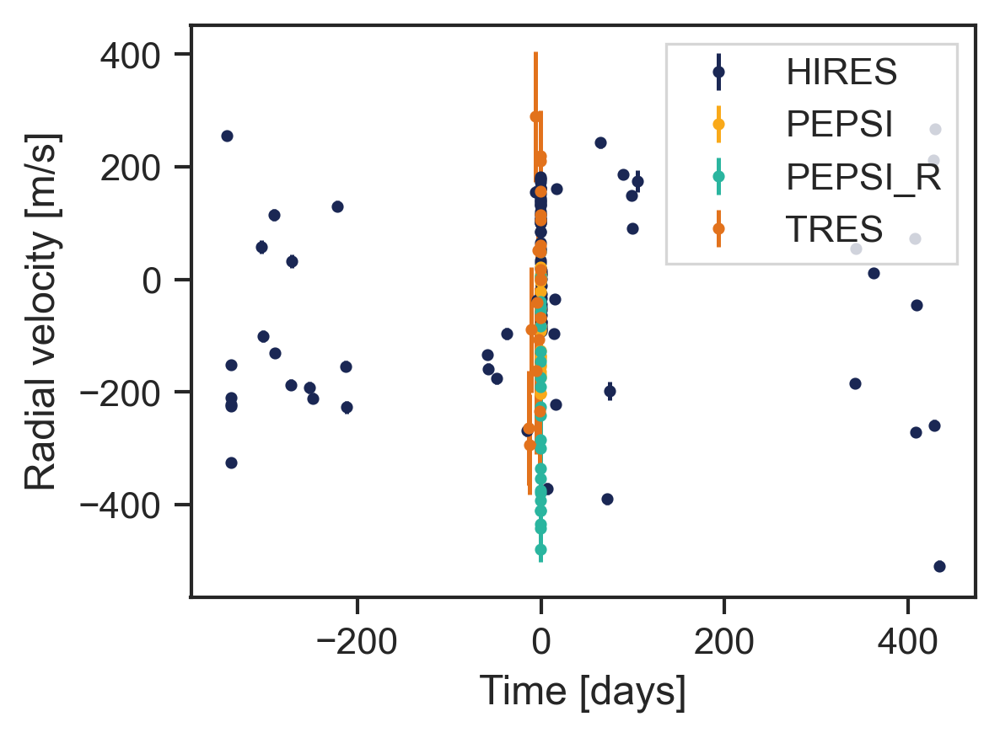

In [63]:
def get_rvs(instruments='all'):

    # Keck/HIRES radial velocities from California Planet Search
    hires = pd.read_csv('./data/epic210818897_rv_new.csv', comment='#')
    hires['time'] = hires['bjd']-time_offset
    hires['rv'] = hires['mnvel']
    hires['err'] = hires['errvel']
    hires['inst_id'] = ['hires']*len(hires)
    hires_flag = np.zeros(len(hires), dtype=bool)

    # IRD radial velocities
    ird = pd.read_csv('./data/ird.csv', comment='#')
    ird['time'] = ird['time']-time_offset
    ird['rv'] = ird['mnvel']
    ird['err'] = ird['errvel']
    ird['inst_id'] = ['ird']*len(ird)
    ird_flag = np.zeros(len(ird), dtype=bool)

    # FLWO/TRES radial velocities from George Zhou
    tres = pd.read_csv('./data/tres.csv')
    tres['time'] = tres['bjd_tdb']-time_offset
    tres['rv'] = 1e3*(tres['rv']-np.median(tres['rv']))
    tres['err'] = 1e3*tres['rverr']
    #tres['inst_id'] = ['tres']*len(tres)
    tres_flag = np.ones(len(tres), dtype=bool)
    tres_flag[np.argmin(tres['rv'])] = False
    
    # Remove bad data point
    tres['time'] = tres['time'][tres_flag]
    tres['rv'] = tres['rv'][tres_flag]
    tres['err'] = tres['err'][tres_flag]
    tres['inst_id'] = ['tres']*len(tres['time'])

    # PEPSI radial velocities from Ilya Ilin
    #pepsi = pd.read_csv('./data/pepsi.csv')
    #pepsi['bjd'] = [Time(str(ut), format='isot', scale='utc').jd for ut in pepsi['ut']]
    
    pepsi = pd.read_csv('./data/pepsi.csv')
    #Drop outlier row
    #pepsi = pepsi.drop([15])
    pepsi['bjd'] = pepsi['hjd_obs']
    pepsi['bjd'] += 0.5*15.0*u.minute.to(u.day) #double check this
    
    pepsi['time'] = pepsi['bjd']-time_offset
    pepsi['chip'] = [fn[5] for fn in pepsi['filename']]
    #pepsi['erv'] *= 2

    blue = pepsi['chip']=='b'
    red  = pepsi['chip']=='r'
    pepsi['inst_id'] = ['pepsi']*len(pepsi)
    pepsi['inst_id'][red] = 'pepsi_r'

    # Compute average RV between the red and blue chips of PEPSI
    #pepsi_avgrv = np.mean([np.array(pepsi['rv'][red]), np.array(pepsi['rv'][blue])], axis=0)
    #pepsi_avgrverr = np.sqrt(np.array(pepsi['erv'][red])**2. + np.array(pepsi['erv'][blue])**2.)
        
    # Concatenate RVs
    if instruments=='all':
        x_rv = list(hires['time'])+list(tres['time'])+list(pepsi['time'])
        y_rv = list(hires['mnvel'])+list(tres['rv'])+list(pepsi['rv'])
        yerr_rv = list(hires['errvel'])+list(tres['err'])+list(pepsi['erv'])
        inst_id = list(hires['inst_id'])+list(tres['inst_id'])+list(pepsi['inst_id'])
    
    elif instruments=='hires':
        x_rv = list(hires['time'])
        y_rv = list(hires['mnvel'])
        yerr_rv = list(hires['errvel'])
        inst_id = list(hires['inst_id'])
        
    x_rv = np.ascontiguousarray(x_rv, dtype=np.float64)
    y_rv = np.ascontiguousarray(y_rv, dtype=np.float64)
    yerr_rv = np.ascontiguousarray(yerr_rv, dtype=np.float64)
    inst_id = np.ascontiguousarray(inst_id, dtype=str)

    # RVs must be sorted for GP modeling
    arg = np.argsort(x_rv)
    x_rv = x_rv[arg]
    y_rv = y_rv[arg]
    yerr_rv = yerr_rv[arg]
    inst_id = inst_id[arg]


    texp_rv = np.median(np.diff(x_rv[abs(x_rv)<0.25]))
    print('Median RV exposure time [minutes]:', texp_rv*24.*60.)

    for inst in np.unique(inst_id):
        arg = inst_id == inst
        plt.errorbar(x_rv[arg], y_rv[arg], yerr=yerr_rv[arg], fmt=".", label=inst.upper())

    plt.xlabel("Time [days]")
    plt.ylabel("Radial velocity [m/s]")
    plt.legend()
    plt.show()
    
    return x_rv, y_rv, yerr_rv, inst_id

x_rv, y_rv, yerr_rv, inst_id = get_rvs(instruments='all')

### Defining masks for the radial velocity time series

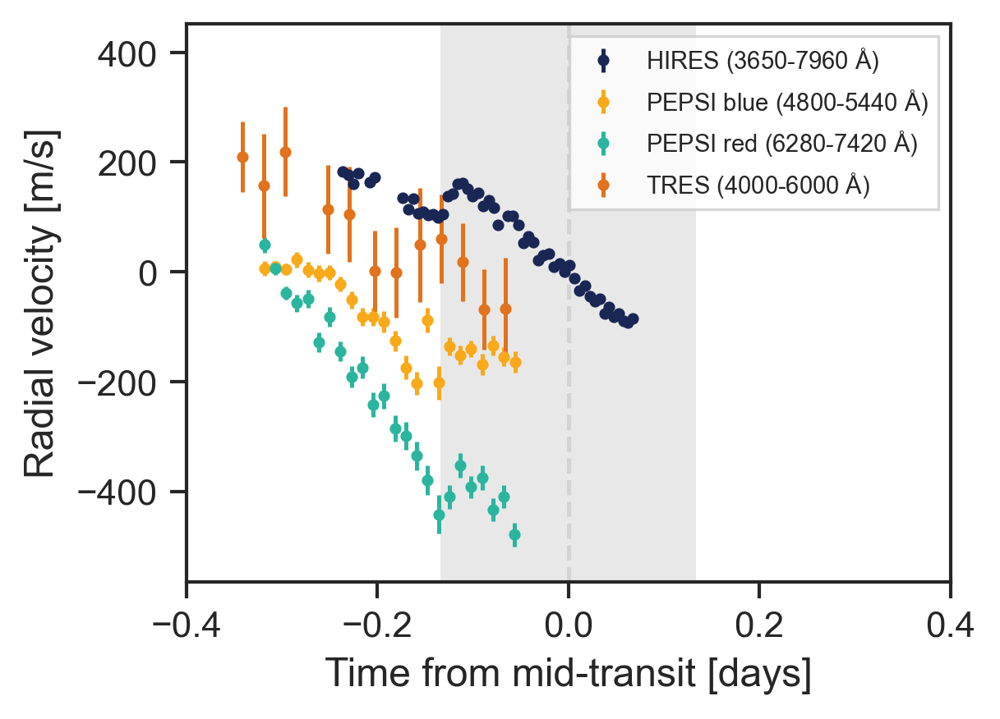

In [64]:
# HIRES data from the RM night only
hires_rm = (inst_id=='hires') & (abs(x_rv)<1)

# All instruments with select data
all_rm = (abs(x_rv)<20) & (inst_id!='pepsi_r')

# PEPSI data only
pepsir = (inst_id=='pepsi_r')
pepsib = (inst_id=='pepsi')

inst_labels = [r'HIRES (3650-7960 $\mathregular{\AA}$)', 
               'PEPSI blue (4800-5440 $\mathregular{\AA}$)', 
               'PEPSI red (6280-7420 $\mathregular{\AA}$)', 
               'TRES (4000-6000 $\mathregular{\AA}$)']

#for inst in np.unique(inst_id[all_rm]):
for i,inst in enumerate(np.unique(inst_id)):
    #_ = all_rm & (inst_id==inst)
    _ = (inst_id==inst)
    plt.errorbar(x_rv[_], y_rv[_], yerr_rv[_], fmt='.', label=inst_labels[i])
#plt.xlim(-20,20)
plt.xlim(-0.4,0.4)
plt.axvspan(-0.5*V1298['t14'], 0.5*V1298['t14'], color='lightgrey', alpha=0.5, lw=0)
plt.axvline(0, color='lightgrey', ls='--')
plt.legend(prop={'size':7}, loc='best')
plt.xlabel('Time from mid-transit [days]')
plt.ylabel('Radial velocity [m/s]')
plt.savefig('./figures/instruments.pdf', bbox_inches='tight')
plt.show()

Median RV exposure time [minutes]: 7.633440122008324
       K2 exposure time [minutes]: 29.43333333333333
  Spitzer exposure time [minutes]: 1.000463292002678


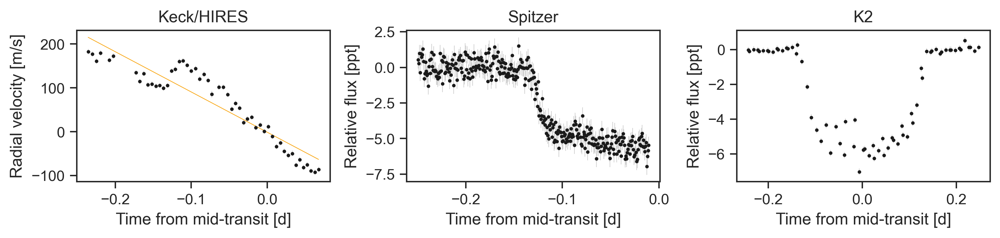

In [170]:
#x_rv  = np.ascontiguousarray(df_rv['bjd']-np.min(df_rv['bjd']), dtype=np.float64)
#y_rv  = np.ascontiguousarray(df_rv['mnvel'], dtype=np.float64)
#e_rv  = np.ascontiguousarray(2*df_rv['errvel'], dtype=np.float64)

def time_from_mid_transit(time, period, t0):
    return ((time-t0-0.5*period)%period) - 0.5*period

# Radial velocity data
hires_df   = pd.read_csv('./data/epic210818897_rv_new.csv', comment='#')
hires_time = np.ascontiguousarray(hires_df['bjd'], dtype=np.float64)
hires_rv   = np.ascontiguousarray(hires_df['mnvel'], dtype=np.float64)
hires_err  = np.ascontiguousarray(hires_df['errvel'], dtype=np.float64)

# To model the RVs with a GP it is necessary to sort the data
arg = np.argsort(hires_time)
hires_time = hires_time[arg]
hires_rv   = hires_rv[arg]
hires_err  = hires_err[arg]

# K2 photometry
ktwo_df   = pd.read_csv('./data/v1298tau-tjd-flat-20190805.csv')
ktwo_time = ktwo_df['x']+2454833.0
ktwo_flux = ktwo_df['y']
ktwo_tfmt = time_from_mid_transit(ktwo_time, t0=V1298['t0'][0], period=V1298['per'][0])

# Mask out of transit data
arg = abs(ktwo_tfmt)<0.25
ktwo_time = ktwo_time[arg]
ktwo_tfmt = ktwo_tfmt[arg]
ktwo_flux = ktwo_flux[arg]

# Spitzer photometry
spitz_df   = pd.read_csv('./data/spitzer-corrected-20190720.csv')
spitz_time = spitz_df['time']
spitz_tfmt = time_from_mid_transit(spitz_time, t0=V1298['t0'][0], period=V1298['per'][0])
spitz_flux = 1e3*(spitz_df['flux']-1.0) #Normalization
spitz_arg  = abs(spitz_tfmt)<0.25

spitz_time = np.ascontiguousarray(spitz_time[spitz_arg], dtype=float)
spitz_tfmt = np.ascontiguousarray(spitz_tfmt[spitz_arg], dtype=float)
spitz_flux = np.ascontiguousarray(spitz_flux[spitz_arg], dtype=float)
spitz_err  = 600*1e-6*1e3

ktwo_time  = np.ascontiguousarray(ktwo_time, dtype=float)
ktwo_tfmt  = np.ascontiguousarray(ktwo_tfmt, dtype=float)
ktwo_flux  = np.ascontiguousarray(ktwo_flux, dtype=float)
ktwo_err   = 180*1e-6*1e3

# We will subtract a constant from all of the timestamps, to be added back in after sampling
#time_offset = 2458781.085449238
hires_time -= time_offset
ktwo_time  -= time_offset
spitz_time -= time_offset

rm_mask = abs(hires_time)<2
hires_time = hires_time[rm_mask]
hires_rv = hires_rv[rm_mask]
hires_err = hires_err[rm_mask]

hires_texp = np.median(np.diff(hires_time))
ktwo_texp  = 1766.0/86400.0
spitz_texp = np.median(np.diff(np.sort(np.array(spitz_time))))
print('Median RV exposure time [minutes]:', hires_texp*24.0*60.0)
print('       K2 exposure time [minutes]:', ktwo_texp*24.0*60.0)
print('  Spitzer exposure time [minutes]:', spitz_texp*24.0*60.0)


#Fit polynomial to RV data
poly_coeff = np.polyfit(hires_time,hires_rv,1)
p=np.poly1d(poly_coeff)
#print(poly_coeff)

plt.subplot(131)
plt.errorbar(hires_time, hires_rv, yerr=hires_err, fmt='.', color='k', ecolor='lightgrey')
plt.plot(hires_time, p(hires_time), 'C1')
plt.xlabel('Time from mid-transit [d]'); plt.ylabel('Radial velocity [m/s]'); plt.title('Keck/HIRES')
plt.subplot(132)
plt.errorbar(spitz_tfmt, spitz_flux, yerr=spitz_err, fmt='.', color='k', ecolor='lightgrey')
plt.xlabel('Time from mid-transit [d]'); plt.ylabel('Relative flux [ppt]'); plt.title('Spitzer')
plt.subplot(133)
plt.errorbar(ktwo_tfmt, ktwo_flux, yerr=ktwo_err, fmt='.', color='k', ecolor='lightgrey')
plt.xlabel('Time from mid-transit [d]'); plt.ylabel('Relative flux [ppt]'); plt.title('K2')

plt.gcf().set_size_inches(10,2.5)
plt.tight_layout()
plt.show()

In [104]:
def Keplers_Third_A(Period, M1, M2=None):
    # Period in [days]
    # M1, M2 in [Solar masses]
    P = Period*u.day.to(u.second)    
    
    if M2:
        GMtot = (M1+M2)*c.GM_sun.cgs.value
    else:
        GMtot = M1*c.GM_sun.cgs.value
    
    a  = (P**2.0 * GMtot/(4.0*np.pi**2.0))**(1.0/3.0)
    return a

def cosi_from_b(b, a_R, ecc=0.0, omega=np.pi/2.0):
    return b/a_R*(1.0+ecc*np.sin(omega))/(1.0-ecc**2.0)

def t14(P, a_R, ror, b, sini):
    return P/np.pi * np.arcsin(1./a_R * np.sqrt((1.+ror)**2. - b**2.)/sini)

In [10]:
# dOmega=0.2 #radians/day
# Om0 = 2*np.pi/(2.870)
# print(2*np.pi/((dOmega + 2*np.pi/2.87)))
# print(2*np.pi/((-dOmega + 2*np.pi/2.87)))

# plt.hist(np.random.normal(2.87, 0.1, int(1e6)), bins=100, histtype='stepfilled')
# plt.axvline(2*np.pi/((dOmega + 2*np.pi/2.87)), color='r')
# plt.axvline(2*np.pi/((-dOmega + 2*np.pi/2.87)), color='r')
# plt.show()

# print(2*np.pi/((dOmega + 2*np.pi/2.87))-2.87)
# print(2*np.pi/((-dOmega + 2*np.pi/2.87))-2.87)

#pm.model_graph.model_to_graphviz(model=model_gp_hires)

In [357]:
#t_rv = np.linspace(hires_time.min() - 0.5, hires_time.max() + 0.5, 1000)
#t_gp = np.linspace(-20,20,1000)

t_rv = np.append(np.linspace(-20,20,1000), 
                 np.linspace(hires_time.min() - 0.5, hires_time.max() + 0.5, 1000))
t_rv = np.sort(t_rv)

def build_model(trend, 
                mask=None,
                instruments='hires',
                start=None, 
                eccentric=False, 
                planet_mass=False, 
                prot_prior='loose'):
    
    if mask is None:
        mask = np.ones(len(x_rv), dtype=bool)
        
    with pm.Model() as model:

        # Parameters for the stellar properties
        BoundedNormal = pm.Bound(pm.Normal, lower=0, upper=5)
        m_star = BoundedNormal("m_star", mu=M_star[0], sd=M_star[1])
        r_star = BoundedNormal("r_star", mu=R_star[0], sd=R_star[1])
        
        # Orbital parameters for the planets
        if planet_mass==True:
            logm = pm.Uniform("logm", lower=np.log(0.1), upper=np.log(1e4))
            m_pl = pm.Deterministic("m_pl", tt.exp(logm))
        elif planet_mass==False:
            m_pl = 0.0
            
        # Transit parameters    
        period = pm.Normal("period", mu=V1298['per'][0], sd=0.1)
        t0   = pm.Normal("t0", mu=0.0, sd=0.1)
        ror  = pm.Uniform("ror", lower=0.0, upper=0.2, testval=0.07)
        r_pl = pm.Deterministic("r_pl", r_star*ror)
        b    = xo.distributions.ImpactParameter("b", ror=ror)            
            
        if eccentric==True:
            ecc = xo.distributions.eccentricity.vaneylen19("ecc")
            omega = xo.distributions.Angle("omega")
        
        elif eccentric==False:
            ecc = 0.0
            omega = np.pi/2.
        
        # Orbit model
        orbit = xo.orbits.KeplerianOrbit(r_star=r_star,
                                         m_star=m_star,
                                         period=period,
                                         t0=t0,
                                         b=b,
                                         m_planet=xo.units.with_unit(m_pl, u.M_earth),
                                         ecc=ecc,
                                         omega=omega)
        
        
        # Compute the model light curve using starry
        u_star       = xo.distributions.QuadLimbDark("u_star")
        u_star_spitz = xo.distributions.QuadLimbDark("u_star_ir")
        mean_ktwo    = pm.Normal("mean_ktwo", mu=0.0, sd=10.0)
        mean_spitz   = pm.Normal("mean_spitz", mu=0.0, sd=10.0)
        
        #t0_ktwo     = pm.Uniform("t0_ktwo", lower=-0.2, upper=0.2)
        #t0_spitz    = pm.Uniform("t0_spitz", lower=-0.2, upper=0.2)
        
        light_curves = (xo.LimbDarkLightCurve(u_star).get_light_curve(orbit=orbit, 
                                                                      r=r_pl, 
                                                                      t=ktwo_time, texp=ktwo_texp) * 1e3)
        light_curve  = pm.math.sum(light_curves, axis=-1) + mean_ktwo
        pm.Deterministic("light_curves", light_curves)
        pm.Deterministic("light_curve", light_curve)
        
        light_curves_spitz = (xo.LimbDarkLightCurve(u_star_spitz).get_light_curve(orbit=orbit, 
                                                                      r=r_pl, 
                                                                      t=spitz_time, texp=spitz_texp) * 1e3)
        light_curve_spitz  = pm.math.sum(light_curves_spitz, axis=-1) + mean_spitz
        
        pm.Deterministic("light_curves_spitz", light_curves_spitz)
        pm.Deterministic("light_curve_spitz", light_curve_spitz)      

        logjit_spitz = pm.Uniform("logjit_spitz", lower=-10, upper=2) 
        jit_spitz    = pm.Deterministic("jit_spitz", tt.exp(logjit_spitz))
        err_spitz    = pm.Deterministic("err_spitz", tt.sqrt(tt.sqr(spitz_err) + tt.sqr(jit_spitz)))

        # Note, we allow K2 error bars to scale with light curve depth to account for excess in-transit scatter
        logjit_ktwo  = pm.Uniform("logjit_ktwo", lower=-10, upper=2) 
        jit_ktwo     = pm.Deterministic("jit_ktwo", tt.exp(logjit_ktwo)*abs(light_curve))
        err_ktwo     = pm.Deterministic("err_ktwo", tt.sqrt(tt.sqr(ktwo_err) + tt.sqr(jit_ktwo)))
        
        # The likelihood function assuming known Gaussian uncertainty
        #pm.Normal takes care of normalization and introduces penalty if errors blow up        
        pm.Normal("obs_spitz", mu=light_curve_spitz, sd=err_spitz, observed=spitz_flux)
        pm.Normal("obs_ktwo", mu=light_curve, sd=err_ktwo, observed=ktwo_flux)
        
        
        #vsini = VsiniBoundedNormal("vsini", mu=V1298['vsini'][0], sd=V1298['vsini'][1])
        #vsini = VsiniBoundedNormal("vsini", mu=25, sd=5)
        #vsini_data     = np.array([23, 25.25, 24.87, 24.63])
        #vsini_data_err = np.array([2, 1, 0.21, 0.53])
        
        #logjit_vsini = pm.Uniform("logjit_vsini", lower=-5, upper=5)
        #vsini_jit = pm.Deterministic("vsini_jit", tt.exp(logjit_vsini))    
        #vsini_err = pm.Deterministic("vsini_err", tt.sqrt(tt.sqr(vsini_data_err) + tt.sqr(vsini_jit)))
        
        #obs_vsini = pm.Normal("obs_vsini", mu=vsini, sigma=vsini_err, observed=vsini_data)
        
        # Modeling the Rossiter-McLaughlin curve with Starry
        VsiniBoundedNormal = pm.Bound(pm.Normal, lower=0, upper=100)
        
        #vsini = VsiniBoundedNormal("vsini", mu=23, sd=2) #David et al. 2019 value
        #vsini = VsiniBoundedNormal("vsini", mu=24.63, sd=0.53) #TRES value
        #vsini = VsiniBoundedNormal("vsini", mu=25.24, sd=1) #SpecMatch value
        vsini = VsiniBoundedNormal("vsini", mu=24.9, sd=0.2) #Marshall's value

        #Draw from uniform distribution in cosi for isotropic viewing angles
        cosi_st   = pm.Uniform("cosi_st", lower=0, upper=1.0)
        sini_st   = pm.Deterministic("sini_st", tt.sin(tt.arccos(cosi_st)))
        i_st      = pm.Deterministic("i_st", tt.arcsin(sini_st)*180./np.pi)
        veq       = pm.Deterministic("veq", vsini/sini_st)
        a_r       = pm.Deterministic("a_r", Keplers_Third_A(period, m_star)/r_star*(u.cm/c.R_sun.cgs).value)
        cosi_pl   = pm.Deterministic("cosi_pl", cosi_from_b(b, a_r))
        i_pl_deg  = pm.Deterministic("i_pl_deg", tt.arccos(cosi_pl)*180./np.pi)
        
        #Track the inferred rotation period
        prot_model = pm.Deterministic("prot_model",1./u.day.to(u.second)*2.*np.pi*r_star*c.R_sun.to(u.km).value/veq)
        
        # Leverage information from the photometrically derived rotation period 
        # to derive self-consistent constraints on vsini, R*, stellar inclination, 
        # and obliquity
        
        # The tight prior corresponds to the constraints on the rotation period from
        # Gaussian process regression on the K2 light curve in David et al. 2019b
        if prot_prior=='tight':            
            prot_obs   = pm.Normal("prot_obs", mu=prot_model, sigma=0.022, observed=2.870)
        
        # The loose prior accounts for additional uncertainty due to differential rotation
        elif prot_prior=='loose':
            prot_obs   = pm.Normal("prot_obs", mu=prot_model, sigma=0.2, observed=2.870)
                
        #############################
        # Rossiter-McLaughlin model #
        #############################

        # True spin-orbit angle (Equation 5 from Triaud, Handbook of Exoplanets 2018)
        #psi    = pm.Deterministic("psi", tt.arccos(cosi_st*cosi_pl + sini_st*sini_pl*tt.cos(obliquity))*180./np.pi)
        
        # Obliquity
        obliquity_rad = pm.Uniform("obliquity_rad", lower=-np.pi, upper=np.pi)
        obliquity = pm.Deterministic("obliquity", obliquity_rad*180./np.pi)

        pri = starry.Primary(
            starry.Map(udeg=2, rv=True, amp=1, veq=veq*1e3, alpha=0.0, obl=obliquity),
            r=r_star,
            m=m_star,
            length_unit=u.Rsun,
            mass_unit=u.Msun,
        )

        # Limb darkening
        pri.map[1] = u_star[0]
        pri.map[2] = u_star[1] 

        # Define the planet
        sec = starry.Secondary(
            starry.Map(rv=True, amp=0, veq=0),
            r=ror*r_star,
            porb=period,
            m=0, #Note we don't want Starry to compute the orbital RV motion since exoplanet is already doing this
            t0=t0,
            inc=i_pl_deg,
            ecc = ecc,
            w = omega*180./np.pi,
            length_unit=u.Rsun,
            mass_unit=u.Msun,
            angle_unit=u.degree,
            time_unit=u.day,
        )

        
        
        # Define the system in Starry
        sys_rv = starry.System(pri, sec, texp=hires_texp)
        # NOTE TEXP



        # Compute the RV signal
        #rm_curve = pm.Deterministic("rm_curve", sys_rv.rv(hires_time))
        rm_curve = pm.Deterministic("rm_curve", sys_rv.rv(x_rv[mask]))
        rm_curve_pred = pm.Deterministic("rm_curve_pred", sys_rv.rv(t_rv))
        
        # RV jitter & a linear RV trend
#         logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(hires_err)), sd=5)
#         err_rv = pm.Deterministic("err_rv", tt.sqrt(hires_err ** 2 + tt.exp(2 * logs_rv)))
        #logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(yerr_rv[mask])), sd=5)
        #err_rv = pm.Deterministic("err_rv", tt.sqrt(yerr_rv[mask] ** 2 + tt.exp(2 * logs_rv)))
        
        
        if instruments=='hires':
            logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(yerr_rv[mask])), sd=5)
            err_rv = pm.Deterministic("err_rv", tt.sqrt(yerr_rv[mask] ** 2 + tt.exp(2 * logs_rv)))            
            
        if (instruments=='hires') and (trend=='gp'):
            # The mean radial velocity of the time series
            mean_hires = pm.Normal("mean_hires", mu=0, sd=50)
            mean_rv = pm.Deterministic("mean_rv", mean_hires*np.ones(len(x_rv)))
            #maybe this should be x_rv[mask]!!
            
        elif instruments=='all':
            # Jitter parameters for each instrument
            logs_rv_hires = pm.Normal("logs_rv_hires", mu=np.log(np.median(yerr_rv[mask&(inst_id=='hires')])), sd=5)
            logs_rv_tres  = pm.Normal("logs_rv_tres",  mu=np.log(np.median(yerr_rv[mask&(inst_id=='tres')])), sd=5)
            logs_rv_pepsi = pm.Normal("logs_rv_pepsi",  mu=np.log(np.median(yerr_rv[mask&(inst_id=='pepsi')])), sd=5)

            logs_rv = pm.Deterministic("logs_rv", 
                                       logs_rv_hires * (inst_id == 'hires') +\
                                       logs_rv_tres * (inst_id == 'tres') +\
                                       logs_rv_pepsi * (inst_id == 'pepsi')
                                      )
            
            # The mean radial velocity of the time series
            mean_hires = pm.Normal("mean_hires", mu=0, sd=50)
            mean_tres  = pm.Uniform("mean_tres", lower=-1000, upper=1000)
            mean_pepsi = pm.Uniform("mean_pepsi", lower=-1000, upper=1000)
            
            mean_rv = pm.Deterministic("mean_rv", mean_hires*(inst_id=='hires') +\
                                       mean_tres*(inst_id=='tres') +\
                                       mean_pepsi*(inst_id=='pepsi')
                                      )            
            
            err_rv = pm.Deterministic("err_rv", tt.sqrt(tt.sqr(yerr_rv[mask]) + tt.exp(2 * logs_rv[mask])))   
        
        
        if trend=="linear":
            #logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(yerr_rv[mask])), sd=5)
            #err_rv = pm.Deterministic("err_rv", tt.sqrt(yerr_rv[mask] ** 2 + tt.exp(2 * logs_rv)))            
            
            c0 = pm.Normal("c0", mu=0, sd=1e5, testval=poly_coeff[1])
            c1 = pm.Normal("c1", mu=0, sd=1e5, testval=poly_coeff[1])

            rv_trend = pm.Deterministic("rv_trend", c0 + c1*x_rv[mask])
            rv_trend_pred = pm.Deterministic("rv_trend_pred", c0 + c1*t_rv)        
        
        elif trend=="quadratic":
            #logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(yerr_rv[mask])), sd=5)
            #err_rv = pm.Deterministic("err_rv", tt.sqrt(yerr_rv[mask] ** 2 + tt.exp(2 * logs_rv)))            
            
            c0 = pm.Normal("c0", mu=0, sd=1e5, testval=poly_coeff[1])
            c1 = pm.Normal("c1", mu=0, sd=1e5, testval=poly_coeff[1])
            c2 = pm.Normal("c2", mu=0, sd=1e5)

            rv_trend = pm.Deterministic("rv_trend", c0 + c1*x_rv[mask] + c2*x_rv[mask]**2)
            rv_trend_pred = pm.Deterministic("rv_trend_pred", c0 + c1*t_rv + c2*t_rv**2)

        elif trend=="cubic":
            #logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(yerr_rv[mask])), sd=5)
            #err_rv = pm.Deterministic("err_rv", tt.sqrt(yerr_rv[mask] ** 2 + tt.exp(2 * logs_rv)))            
            
            c0 = pm.Normal("c0", mu=0, sd=1e5, testval=poly_coeff[1])
            c1 = pm.Normal("c1", mu=0, sd=1e5, testval=poly_coeff[1])
            c2 = pm.Normal("c2", mu=0, sd=1e5)
            c3 = pm.Normal("c3", mu=0, sd=1e5)

            rv_trend = pm.Deterministic("rv_trend", c0 + c1*x_rv[mask] + c2*x_rv[mask]**2 + c3*x_rv[mask]**3)
            rv_trend_pred = pm.Deterministic("rv_trend_pred", c0 + c1*t_rv + c2*t_rv**2 + c3*t_rv**3)            
            
        elif trend=="gp":
            #elif instruments=='all':
            
            # Parameters of the RotationTerm kernel
            log_amp    = pm.Normal("log_amp", mu=np.log(np.var(y_rv[mask])), sd=10, testval=10)
            log_Q0     = pm.Normal("log_Q0", mu=1, sd=10, testval=0.16)
            log_deltaQ = pm.Normal("log_deltaQ", mu=2, sd=10, testval=4.4)
            mix        = xo.distributions.UnitUniform("mix")
            
            # Set up the Gaussian process model
            kernel     = xo.gp.terms.RotationTerm(log_amp=log_amp, 
                                                 period=prot_model, 
                                                 log_Q0=log_Q0, 
                                                 log_deltaQ=log_deltaQ, 
                                                 mix=mix)

            gp = xo.gp.GP(kernel, x_rv[mask], tt.sqr(err_rv))
            
        # Set up the RV model and save it as a deterministic
        # for plotting purposes later
#         if planet_mass==True:
#             #pl_rv = orbit.get_radial_velocity(hires_time)
#             pl_rv = orbit.get_radial_velocity(x_rv[mask])
#             pm.Deterministic("pl_rv", pl_rv)
#             pl_rv_pred = orbit.get_radial_velocity(t_rv)
#             pm.Deterministic("pl_rv_pred", pl_rv_pred)        
            
#             rv_model = pm.Deterministic("rv_model", pl_rv + rm_curve + rv_trend)
#             rv_model_pred = pm.Deterministic("rv_model_pred", pl_rv_pred + rm_curve_pred + rv_trend_pred)
            
#         elif planet_mass==False:
#             rv_model = pm.Deterministic("rv_model", rm_curve + rv_trend)
#             rv_model_pred = pm.Deterministic("rv_model_pred", rm_curve_pred + rv_trend_pred)        
                    
        # Likelihood for RVs
        if trend != "gp":
            rv_model = pm.Deterministic("rv_model", rm_curve + rv_trend)
            rv_model_pred = pm.Deterministic("rv_model_pred", rm_curve_pred + rv_trend_pred)                    
            pm.Normal("obs", mu=rv_model, sd=err_rv, observed=y_rv[mask])
            
        elif trend == "gp":
            rv_model = pm.Deterministic("rv_model", rm_curve)
            rv_model_pred = pm.Deterministic("rv_model_pred", rm_curve_pred)
                                   
            # Compute the Gaussian Process likelihood and add it into the the PyMC3 model as a "potential"
            #pm.Potential("loglike_rv", gp_rv.log_likelihood(y_rv[rv_mask] - tt.sum(pl_rv, axis=-1) - mean_rv[rv_mask] - rm_curve))
            pm.Potential("loglike_rv", gp.log_likelihood(y_rv[mask] - mean_rv[mask] - rv_model))
            
            # Compute the mean model prediction for plotting purposes 
            gp_rv      = pm.Deterministic("gp_rv", gp.predict(x_rv[mask]))
            gp_rv_pred = pm.Deterministic("gp_rv_pred", gp.predict(t_rv))                           
            #rv_model = pm.Deterministic("rv_model", st_rv + rm_curve + tt.sum(pl_rv, axis=-1))

            
        if trend=='gp':
            model.gp = gp
        model.orbit = orbit
        model.sys_rv = sys_rv

        # Fit for the maximum a posteriori parameters
        if start is None:
            start = model.test_point
        map_soln = xo.optimize(start=start)
        map_soln = xo.optimize(start=map_soln, vars=[ror, b, logjit_ktwo, logjit_spitz])
        map_soln = xo.optimize(start=map_soln, vars=[period, t0])
        
        if trend=="linear":
            map_soln = xo.optimize(start=map_soln, vars=[c0, c1, obliquity_rad])
        elif trend=="quadratic":
            map_soln = xo.optimize(start=map_soln, vars=[c0, c1, c2, obliquity_rad])
        elif trend=="cubic":
            map_soln = xo.optimize(start=map_soln, vars=[c0, c1, c2, c3, obliquity_rad])            
        if instruments=='all':
            map_soln = xo.optimize(start=map_soln, vars=[mean_hires, mean_pepsi, mean_tres])
        elif trend=='gp':
            map_soln = xo.optimize(start=map_soln, vars=[log_amp, log_Q0, log_deltaQ, mix, obliquity_rad])

        map_soln = xo.optimize(start=map_soln, vars=[logjit_ktwo, logjit_spitz, logs_rv])
        map_soln = xo.optimize(start=map_soln)

    return model, map_soln

In [358]:
def plot_rm_curve(soln, mask=None):

    if mask is None:
        mask = np.ones(len(x_rv), dtype=bool)

    plt.subplot(211)
    plt.errorbar(x_rv[mask], y_rv[mask], yerr=soln["err_rv"], fmt='.', color='k')
    plt.plot(t_rv, soln['rv_model_pred'], 'C1', zorder=99)
    plt.xlim(-0.25,0.25)
    plt.ylim(-300,300)
    plt.ylabel(r'Radial velocity [m s$^\mathregular{-1}$]')
    plt.subplot(212)
    plt.axhline(0, color='lightgrey')
    plt.errorbar(x_rv[mask], y_rv[mask]-soln['rv_model'], yerr=soln["err_rv"], fmt='.', color='k', lw=0.5)
    plt.xlim(-0.25,0.25)
    plt.xlabel('JD - offset [days]')
    plt.ylabel(r'Residuals [m s$^\mathregular{-1}$]')
    plt.gcf().set_size_inches(4,4)
    plt.show()
    
    
def plot_map_soln(map_soln, mask=None, gp=False, figpath=None):

    if mask is None:
        mask = np.ones(len(x_rv), dtype=bool)
        
    
    mpl.rcParams['lines.linewidth'] = 0.5
    mpl.rcParams['lines.markersize'] = 3
    
    time_hires = np.linspace(-0.25,0.25,int(1e3))
    tfmt_hires = ((hires_time-map_soln['t0']-0.5*map_soln['period'])%map_soln['period']) - 0.5*map_soln['period']

    lc_tfmt = ((ktwo_time-map_soln['t0']-0.5*map_soln['period'])%map_soln['period']) - 0.5*map_soln['period']
    spitz_tfmt = ((spitz_time-map_soln['t0']-0.5*map_soln['period'])%map_soln['period']) - 0.5*map_soln['period']
    
    arg = np.argsort(lc_tfmt)
    arg = np.argsort(tfmt_hires)

    fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=3, figsize=(10,4))

    ax1[0].set_title("Keck/HIRES")
    #ax1[0].errorbar(hires_time, hires_rv, yerr=map_soln["err_rv"], color='k', fmt='.')
    if gp==False:
        ax1[0].errorbar(x_rv[mask], y_rv[mask], yerr=map_soln["err_rv"], color='k', fmt='.')
        ax2[0].errorbar(x_rv[mask], y_rv[mask]-map_soln["rv_model"], yerr=map_soln["err_rv"], color='k', fmt='.')
    elif gp==True:
        ax1[0].errorbar(x_rv[mask], y_rv[mask]-map_soln["gp_rv"]-map_soln["mean_rv"][mask], yerr=map_soln["err_rv"], color='k', fmt='.')
        ax2[0].errorbar(x_rv[mask], y_rv[mask]-map_soln["gp_rv"]-map_soln["mean_rv"][mask]-map_soln["rv_model"], yerr=map_soln["err_rv"], color='k', fmt='.')
    ax1[0].plot(t_rv, map_soln["rv_model_pred"], "C1-", zorder=999, lw=2, alpha=0.5)
    ax1[0].set_ylabel(r'Radial velocity [m s$^\mathregular{-1}$]')
    ax1[0].set_xlim(-0.25,0.25)
    ax1[0].set_ylim(-250,250)

    ax2[0].axhline(0, color="C1", ls='--', zorder=999)    
    ax2[0].set_xlabel('Time from mid-transit [days]')
    ax2[0].set_ylabel(r'O-C [m s$^\mathregular{-1}$]')
    ax2[0].set_xlim(-0.25,0.25)

    ax1[1].set_title("Spitzer")
    ax1[1].errorbar(spitz_tfmt, spitz_flux, yerr=map_soln["err_spitz"], color='k', fmt='.')
    ax1[1].plot(spitz_tfmt, map_soln["light_curve_spitz"], "C1-", zorder=999, lw=2, alpha=0.9)
    ax1[1].set_ylabel('Relative flux [ppt]')
    ax1[1].set_xlim(-0.25,0.25)

    ax2[1].axhline(0, color="C1", ls='--', zorder=999)
    ax2[1].errorbar(spitz_tfmt, (spitz_flux-map_soln["light_curve_spitz"]), yerr=map_soln["err_spitz"], color='k', fmt='.')
    ax2[1].set_xlabel('Time from mid-transit [days]')
    ax2[1].set_ylabel(r'O-C [ppt]')
    ax2[1].set_xlim(-0.25,0.25)

    ax1[2].set_title("K2")
    ind = np.argsort(ktwo_tfmt)
    ax1[2].errorbar(ktwo_tfmt, ktwo_flux, yerr=map_soln["err_ktwo"], color='k', fmt='.')
    ax1[2].plot(ktwo_tfmt[ind], map_soln["light_curve"][ind], "C1-", zorder=999, lw=2, alpha=0.5)
    ax1[2].set_ylabel('Relative flux [ppt]')
    ax1[2].set_xlim(-0.25,0.25)

    ax2[2].axhline(0, color="C1", ls='--', zorder=999)
    ax2[2].errorbar(ktwo_tfmt, (ktwo_flux-map_soln["light_curve"]), yerr=map_soln["err_ktwo"], color='k', fmt='.')
    ax2[2].set_xlabel('Time from mid-transit [days]')
    ax2[2].set_ylabel(r'O-C [ppt]')
    ax2[2].set_xlim(-0.25,0.25)

    plt.tight_layout()
    if figpath:
        plt.savefig(figpath, bbox_inches='tight')
    plt.show()
    
    return 

def plot_gp_soln(map_soln, model, mask=None):
    
    x_gp = np.linspace(-20,20,1000)
    with model:
        y_gp = xo.eval_in_model(model.gp.predict(x_gp), map_soln)
    
    if mask is None:
        mask = np.ones(len(x_rv), dtype=bool)
        
    fig = plt.figure(constrained_layout=False, figsize=(9,4))
    spec = fig.add_gridspec(ncols=2, nrows=2, hspace=0.0, wspace=0.4, width_ratios=[1,1], height_ratios=[2,1])

    ax1 = fig.add_subplot(spec[0, 0])
    ax2 = fig.add_subplot(spec[0, 1])

    ax3 = fig.add_subplot(spec[1, 0])
    ax4 = fig.add_subplot(spec[1, 1])

    ebar_kwargs = {"fmt":"o", "ms":3, "mfc":"None", "lw":0.5, "mew":0.5}

    resid = y_rv[mask] - map_soln["mean_rv"][mask] - map_soln["rm_curve"] - map_soln["gp_rv"]
    rv_out = abs(resid)/map_soln["err_rv"] > 3

    for ax in [ax1,ax2]:
        ax.plot(t_rv, map_soln["rm_curve_pred"]+map_soln["gp_rv_pred"], color='#2e2e2e', lw=0.5)

        for inst in np.unique(inst_id[mask]):
            _ = inst_id[mask]==inst
            ax.errorbar(x_rv[mask][_], y_rv[mask][_]-map_soln["mean_rv"][mask][_], yerr=map_soln["err_rv"][_], label=inst.upper(), **ebar_kwargs)

        ax.set_ylabel('Radial velocity [m/s]')
        ax.legend()
        ax.set_xticklabels([])

        ax.plot(x_rv[mask][rv_out], y_rv[mask][rv_out] - map_soln["mean_rv"][mask][rv_out], 'rx')
    
    ax1.plot(x_gp, y_gp, color='#2e2e2e', lw=0.5)
    
    for ax in [ax3,ax4]:
        for inst in np.unique(inst_id[mask]):            
            _ = inst_id[mask]==inst
            ax.errorbar(x_rv[mask][_], resid[_], 
                        yerr=map_soln["err_rv"][_], label=inst.upper(), **ebar_kwargs)
            
        ax.plot(x_rv[mask][rv_out], resid[rv_out], 'rx')

        ax.set_xlabel('Time from mid-transit [days]')
        ax.set_ylabel('Residuals [m/s]')
        ax.axhline(0, color='k', lw=0.5)

    ax2.set_xlim(-0.4,0.2)
    ax4.set_xlim(-0.4,0.2)
    plt.show()
    
    print(map_soln["obliquity"])
    
    return ~rv_out

In [367]:
model_line, map_soln_line = build_model(trend="linear", 
                                        mask=hires_rm, 
                                        prot_prior="loose")

model_quad, map_soln_quad = build_model(trend="quadratic", 
                                        mask=hires_rm, 
                                        prot_prior="loose")

optimizing logp for variables: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -14311.069041529398 -> -548.4375417541233
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -548.4375417541233 -> -548.4375417541219
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -548.4375417541219 -> -548.437541754038
optimizing logp for variables: [obliquity_rad, c1, c0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -548.4375417540383 -> -548.4375417540382
optimizing logp for variables: [logs_rv, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -548.4375417540382 -> -548.4375417540366
optimizing logp for variables: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -548.4375417540364 -> -548.4375417540364
optimizing logp for variables: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -14323.500905527573 -> -553.4934086044852
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -553.4934086044852 -> -553.4934086044847
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -553.4934086044847 -> -553.4934086044847
optimizing logp for variables: [obliquity_rad, c2, c1, c0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -553.4934086044847 -> -553.4934086044847
optimizing logp for variables: [logs_rv, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -553.4934086044847 -> -553.4934086044847
optimizing logp for variables: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -553.4934086044847 -> -553.4934086044847


In [70]:
model_line_protprio, map_soln_line_protprio = build_model(trend="linear", 
                                                          mask=hires_rm, 
                                                          prot_prior="tight")

model_quad_protprio, map_soln_quad_protprio = build_model(trend="quadratic", 
                                                          mask=hires_rm, 
                                                          prot_prior="tight")

optimizing logp for variables: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -14779.755682428435 -> -548.5608388655031
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -548.5608388655031 -> -548.5608388655031
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -548.5608388655031 -> -548.5608388655031
optimizing logp for variables: [obliquity_rad, c1, c0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -548.5608388655032 -> -548.5608388655032
optimizing logp for variables: [logs_rv, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -548.5608388655032 -> -548.5608388655032
optimizing logp for variables: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -548.5608388655031 -> -548.5608388655031
optimizing logp for variables: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -14792.18754642661 -> -555.1178700755102
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -555.1178700755102 -> -555.1178700755102
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -555.1178700755102 -> -555.1178700755102
optimizing logp for variables: [obliquity_rad, c2, c1, c0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -555.1178700755099 -> -555.1178700755099
optimizing logp for variables: [logs_rv, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -555.1178700755099 -> -555.1178700755099
optimizing logp for variables: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -555.1178700755102 -> -555.1178700755102


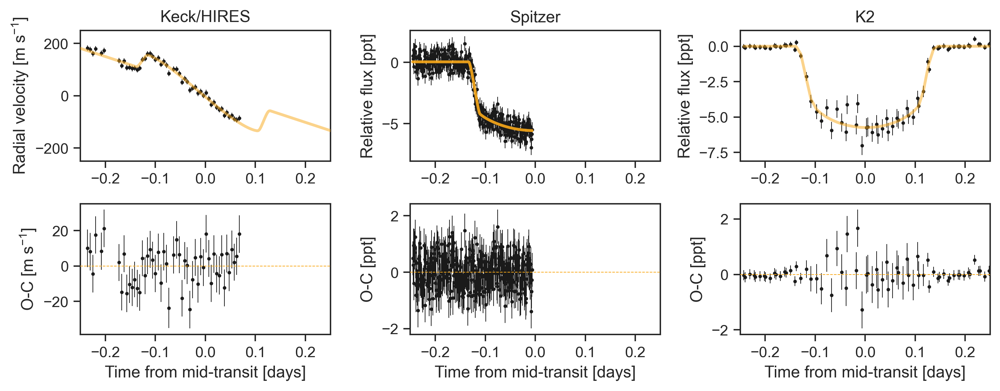

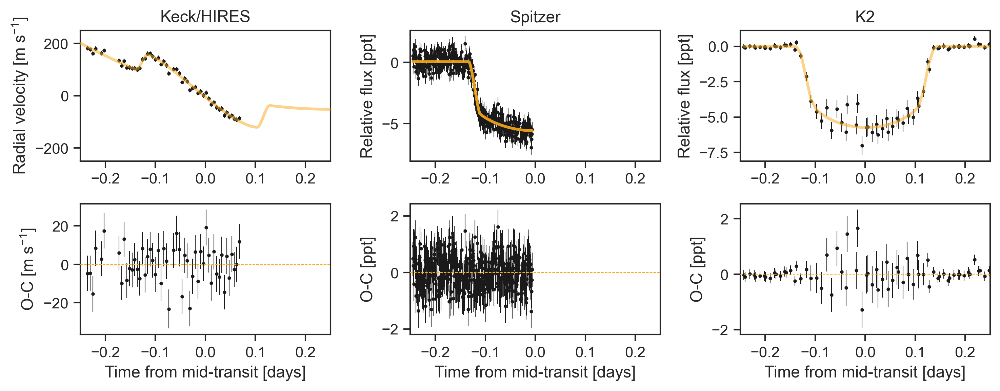

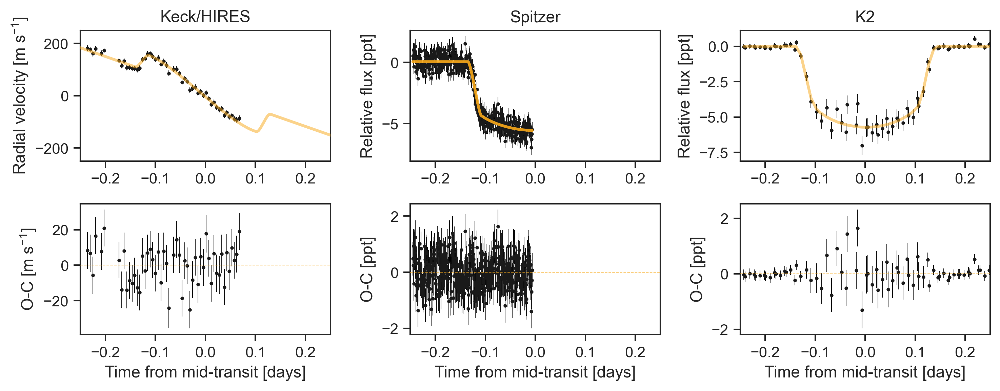

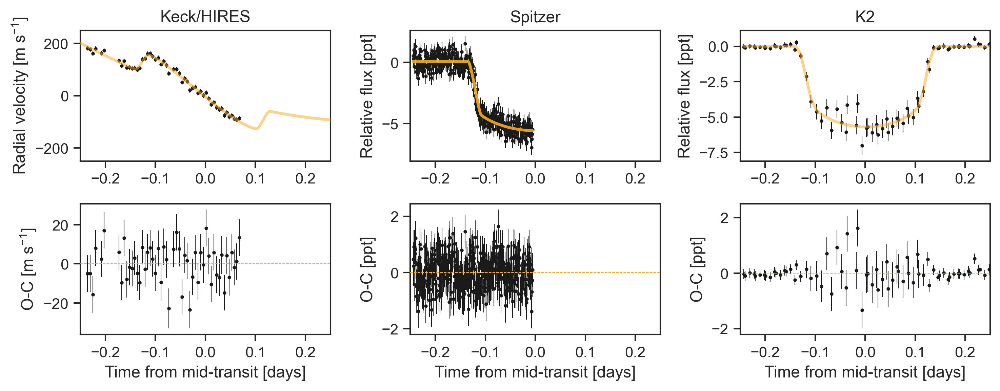

In [368]:
plot_map_soln(map_soln_line, mask=hires_rm)
plot_map_soln(map_soln_quad, mask=hires_rm)

plot_map_soln(map_soln_line_protprio, mask=hires_rm, figpath='./figures/map-linear-protprio.pdf')
plot_map_soln(map_soln_quad_protprio, mask=hires_rm, figpath='./figures/map-quad-protprio.pdf')

In [369]:
model_gp, map_soln_gp = build_model(trend="gp", 
                                    mask=all_rm, 
                                    instruments="all", 
                                    prot_prior="loose")

model_gp_protprio, map_soln_gp_protprio = build_model(trend="gp", 
                                                      mask=all_rm, 
                                                      instruments="all",
                                                      prot_prior="tight")

model_gp_hires, map_soln_gp_hires = build_model(trend="gp", 
                                             mask=hires_rm, 
                                             instruments="hires",
                                             prot_prior="loose")

model_gp_protprio_hires, map_soln_gp_protprio_hires = build_model(trend="gp", 
                                             mask=hires_rm, 
                                             instruments="hires",
                                             prot_prior="tight")

optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -14257.992433803789 -> -850.2436685826503
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -850.2436685826503 -> -850.2436685826503
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -850.2436685826503 -> -850.2436685826503
optimizing logp for variables: [mean_tres, mean_pepsi, mean_hires]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -850.2436685826499 -> -850.2436685826499
optimizing logp for variables: [logs_rv_hires, logs_rv_tres, logs_rv_pepsi, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -850.2436685826499 -> -850.2436685826499
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -850.2436685826503 -> -850.2436685826503
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -14726.679074702826 -> -850.2479246679892
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -850.2479246679892 -> -850.2479246679803
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -850.2479246679803 -> -850.2479246679803
optimizing logp for variables: [mean_tres, mean_pepsi, mean_hires]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -850.2479246679804 -> -850.2479246679793
optimizing logp for variables: [logs_rv_hires, logs_rv_tres, logs_rv_pepsi, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -850.2479246679793 -> -850.2479246679744
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -850.2479246679744 -> -850.2479246679744
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_hires, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -13025.204964993092 -> -543.9924404883673
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -543.9924404883673 -> -543.9924404883672
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -543.9924404883672 -> -543.9924404883672
optimizing logp for variables: [obliquity_rad, mix, log_deltaQ, log_Q0, log_amp]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -543.9924404883673 -> -543.9924404883673
optimizing logp for variables: [logs_rv, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -543.9924404883673 -> -543.9924404883673
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_hires, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -543.9924404883672 -> -543.9924404883672
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_hires, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -13493.89160589213 -> -545.1472562928396
optimizing logp for variables: [logjit_spitz, logjit_ktwo, b, ror]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -545.1472562928396 -> -545.1472562928396
optimizing logp for variables: [t0, period]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -545.1472562928396 -> -545.1472562927992
optimizing logp for variables: [obliquity_rad, mix, log_deltaQ, log_Q0, log_amp]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -545.1472562927992 -> -545.1472562927992
optimizing logp for variables: [logs_rv, logjit_spitz, logjit_ktwo]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -545.1472562927992 -> -545.1472562927992
optimizing logp for variables: [mix, log_deltaQ, log_Q0, log_amp, mean_hires, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]


0it [00:00, ?it/s]

message: Desired error not necessarily achieved due to precision loss.
logp: -545.1472562927992 -> -545.1472562927992


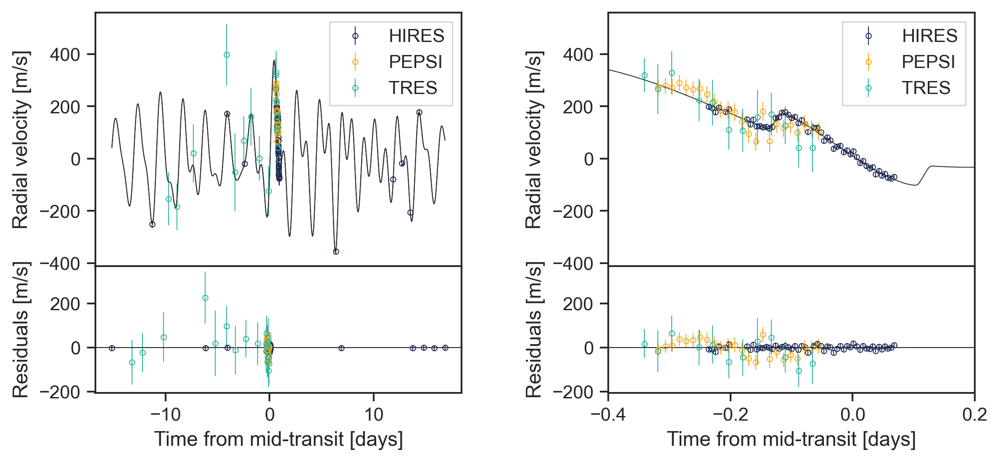

0.7443556966205043


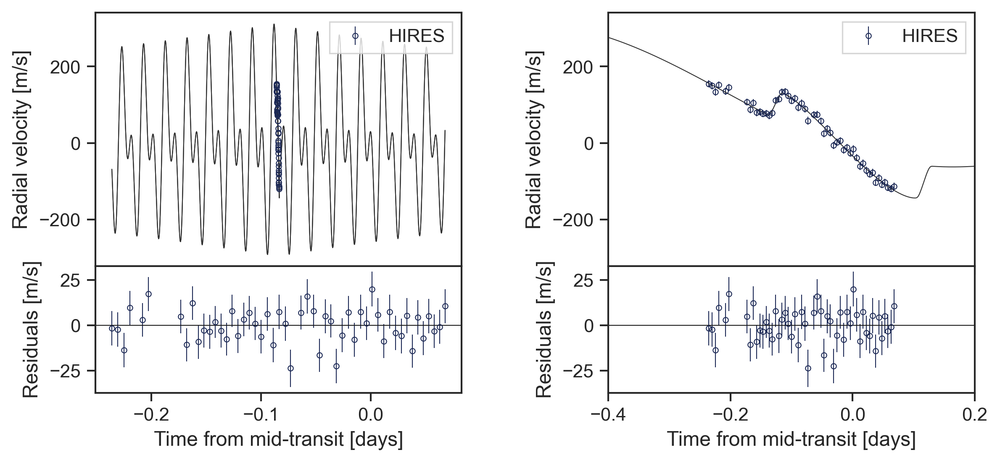

-6.133882121079271


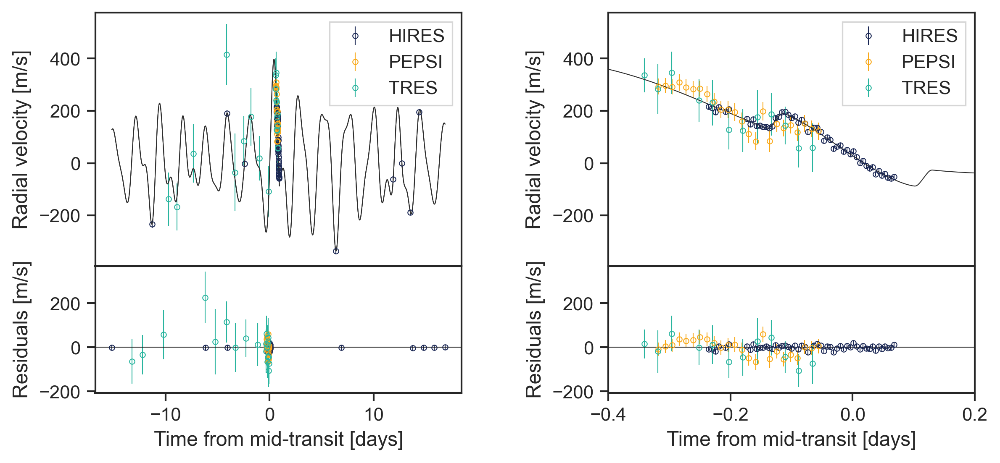

5.94258085178464


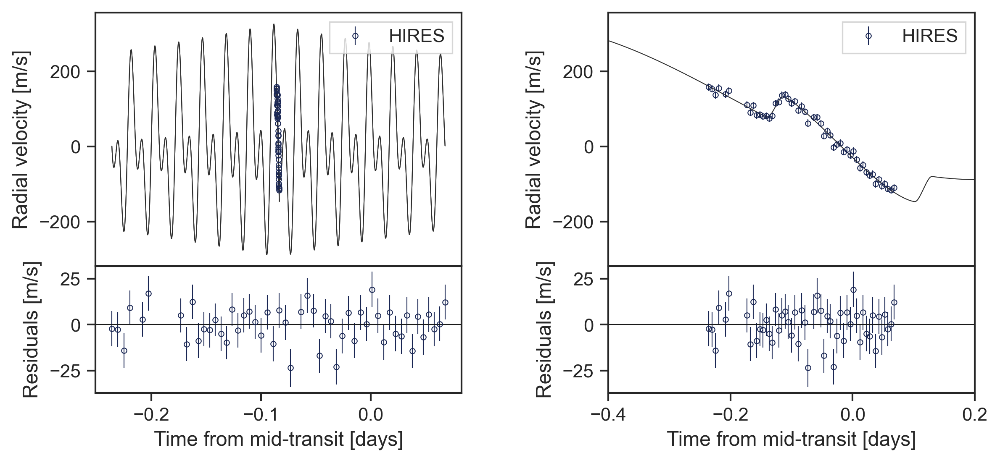

1.5714643627072669


In [370]:
_ = plot_gp_soln(map_soln_gp, model_gp, mask=all_rm)
_ = plot_gp_soln(map_soln_gp_hires, model_gp_hires, mask=hires_rm)
_ = plot_gp_soln(map_soln_gp_protprio, model_gp_protprio, mask=all_rm)
_ = plot_gp_soln(map_soln_gp_protprio_hires, model_gp_protprio_hires, mask=hires_rm)

The default 'target_accept' parameter in PyMC3 is 0.9. After some initial sampling and experimenting with the value of this parameter, we found that about 3% of samples were diverging using a 90% proposal acceptance rate. We increased the acceptance rate to 95% and there were no diverging samples with the corresponding decrease in step size.

### Sampling

In [532]:
def sample_model(model, 
                 start, 
                 tune=5000, 
                 draws=2500, 
                 chains=2, 
                 cores=1, 
                 target_accept=0.95):

    start_time = timer.time()    
    with model:
        trace = pm.sample(
            tune=tune,
            draws=draws,
            start=start,
            chains=chains,
            cores=cores,
            step=xo.get_dense_nuts_step(target_accept=target_accept),
            random_seed=1298
        )
        
    end_time = timer.time()
    print('Time elapsed:', (end_time-start_time)/60, ' minutes')
    return trace

def get_varnames(trace):
    vnames = []
    for v in trace.varnames:
        
        excluded_list = ['interval',
                    'curve',
                    'err_rv',
                    'model',
                    'trend',
                    'impact',
                    'quadlimbdark',
                    '_ktwo',
                    'pred',
                    'logs_rv',
                    'mean_rv',
                    'gp_rv',
                    'logodds'
                    ]
        
        if any(ele in v for ele in excluded_list)==True:
            continue
        else:
            vnames.append(v)
            
    return vnames

def print_report(trace, var_names, table_path=None):
    
    summary_table = pm.summary(trace, var_names=var_names, round_to=6, fmt='wide')
    if table_path:
        f = open(table_path, "w")
        f.write(summary_table.to_latex())
        f.close()    
    #print(summary_table.to_latex())
    return


def az_report(trace, var_names, table_path=None, 
              kind='stats', 
              fmt='wide',
              round_to=6):
    
    summary_table = az.summary(trace, 
                               var_names=var_names, 
                               round_to=round_to, 
                               fmt=fmt, 
                               kind=kind)
    if table_path:
        f = open(table_path, "w")
        f.write(summary_table.to_latex())
        f.close()    
    #print(summary_table.to_latex())
    
    return summary_table

def true_psi(i_st, i_pl, oblq):
    #Equation 9 of Fabrycky & Winn 2009
    i_st_rad = i_st * np.pi/180.
    i_pl_rad = i_pl * np.pi/180.
    oblq_rad = oblq * np.pi/180.     
    psi = np.arccos(np.sin(i_st_rad)*np.cos(oblq_rad)*np.sin(i_pl_rad) + np.cos(i_st_rad)*np.cos(i_pl_rad)) 
    return psi*180./np.pi


def plot_rm_trace(soln, gp=False, savefig=False, text=None, mcolor='C1'):
    
    tmid = 0.0
    tdur = 24.0*np.median(t14(soln['period'], 
                    soln['a_r'],
                    soln['ror'],
                    soln['b'],
                    np.sin(np.arccos(soln['cosi_pl']))))
    
    if gp==False:
        model_rm = np.nanpercentile(soln['rv_model_pred'], [16,50,84], axis=0)
        resid = hires_rv-np.nanmedian(soln['rv_model'], axis=0)
    elif gp==True:
        model_rm = np.nanpercentile(soln['rv_model_pred'] + soln["gp_rv_pred"] + np.vstack([soln["mean_hires"]]*np.shape(soln)[0]).T, [16,50,84], axis=0) 
        resid = hires_rv - np.nanmedian(soln['rv_model'] + soln["gp_rv"], axis=0) - np.median(soln["mean_hires"], axis=0)
        #- np.median(trace_gp_protprio_hires['mean_rv'],axis=1)
        
    plt.subplot(211)
    if text:
        plt.title(text)
    plt.axvline(0, color='lightgrey', lw=1)
    plt.axvspan(-0.5*tdur, 0.5*tdur, color='lightgrey', alpha=0.2, zorder=0)
    plt.errorbar(24.*(hires_time-tmid), hires_rv, yerr=np.nanmedian(soln["err_rv"]), fmt='.', color='k', label='data', zorder=3)
    
    
    #resid = y_rv[mask] - map_soln["mean_rv"][mask] - map_soln["rm_curve"] - map_soln["gp_rv"]
    
    
    plt.plot(24.*(t_rv-tmid), model_rm[1], color=mcolor, lw=1, zorder=2, label='model')
    
    art = plt.fill_between(24.*(t_rv-tmid), model_rm[0], model_rm[2], color=mcolor, alpha=0.5, zorder=1)
    art.set_edgecolor("none")                            
    

    plt.xticks(np.arange(-6,8,2),[])
    plt.xlim(-6,6)
    plt.ylim(-250,250)
    plt.ylabel('Radial velocity [m s$^\mathregular{-1}$]')
    plt.legend(fancybox=False, loc='lower left')
    plt.subplot(212)
    plt.axvline(0, color='lightgrey', lw=1)
    plt.axvspan(-0.5*tdur, 0.5*tdur, color='lightgrey', alpha=0.25, zorder=0, lw=0)    
    plt.axhline(0, color='lightgrey')

    
    rms = np.sqrt(np.median(resid ** 2))
    
    plt.errorbar(24.*(hires_time-tmid), resid, yerr=np.nanmedian(soln["err_rv"]), fmt='.', color='k', lw=0.5, zorder=999)
    plt.text(0.78,0.05, 
             'rms = \n'+'{:.2f}'.format(rms)+' m s$^\mathregular{-1}$', 
             size=10, transform=plt.gca().transAxes)
    
    plt.xlim(-6,6)
    plt.xlabel('Time from mid-transit [hours]')
    plt.ylabel(r'Residuals [m s$^\mathregular{-1}$]', labelpad=10)
    plt.gcf().set_size_inches(4,4)
    plt.subplots_adjust(hspace=0)
    if savefig:
        plt.savefig(savefig, bbox_inches='tight')    
    plt.show()

### Sampling

In [86]:
trace_line_protprio = sample_model(model_line_protprio, start=map_soln_line_protprio)

Sequential sampling (2 chains in 1 job)
NUTS: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 7500/7500 [19:40<00:00,  6.35it/s]


Time elapsed: 44.91150313218434  minutes


In [132]:
pm.save_trace(trace_line_protprio, 'trace_line_protprio', overwrite=True)

'trace_line_protprio'

In [111]:
print_report(trace_line_protprio, get_varnames(trace_line_protprio), table_path="trace_line_protprio.tex")

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


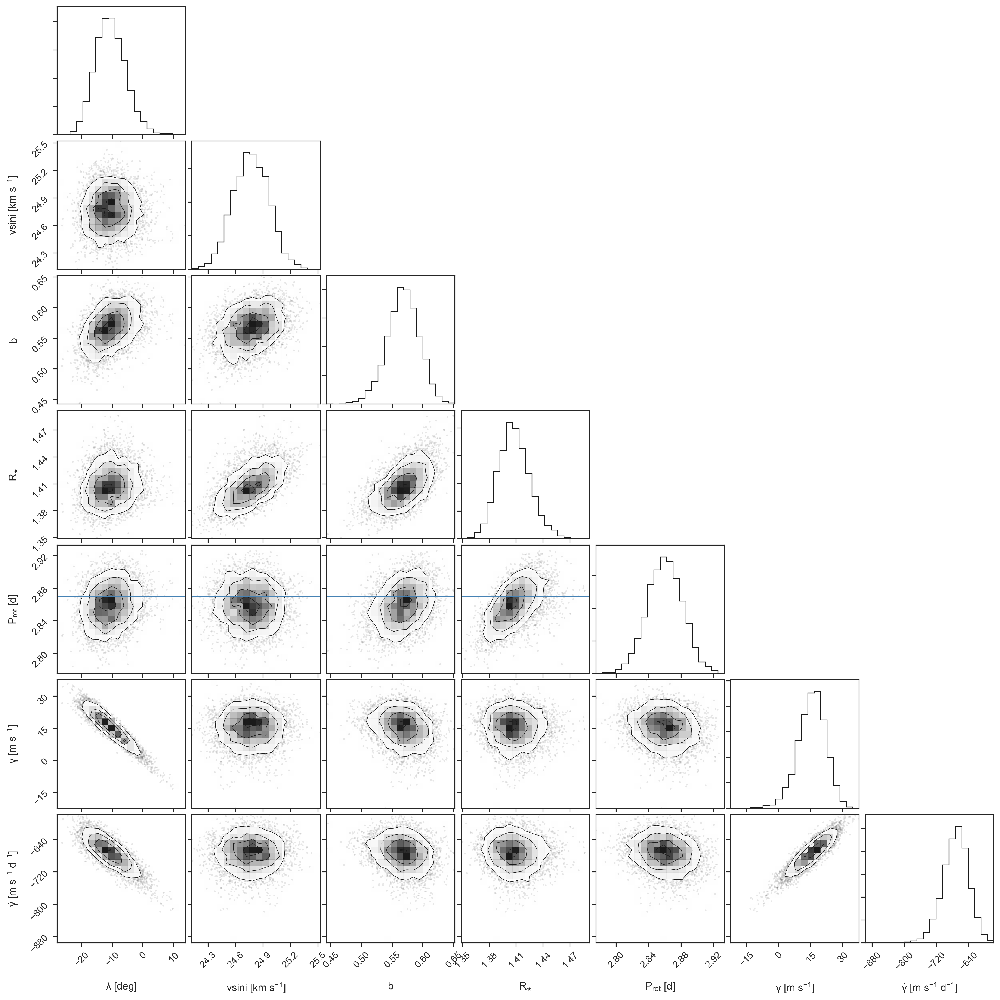

In [112]:
varnames = ["obliquity", "vsini", "b", "r_star", "prot_model", "c0", "c1"]
samples = pm.trace_to_dataframe(trace_line_protprio, varnames=varnames)
fig = corner.corner(samples, labels=[r'$\mathregular{\lambda}$ [deg]', 'vsini [km s$^\mathregular{-1}$]', 'b',
                                     r'R$_\mathregular{\star}$', 'P$_\mathregular{rot}$ [d]',
                                     '$\mathregular{\gamma}$ [m s$^\mathregular{-1}$]', 
                                     '$\mathregular{\dot \gamma}$ [m s$^\mathregular{-1}$ d$^\mathregular{-1}$]'],
                                     truths=[None,None,None,None,2.87,None,None]);
plt.savefig('./figures/corner-linear-protprio.pdf')

In [373]:
def sampler_pipeline(_model, _map_soln, model_name, tune=2500, draws=2000):
    
    #Run sampler
    trace = sample_model(_model, start=_map_soln, tune=tune, draws=draws)
    #Save the trace
    pm.save_trace(trace, model_name, overwrite=True)
    
    #Save the summary to a LaTeX table
    print_report(trace, get_varnames(trace), table_path="./latex_tables/"+model_name+'.tex')

    #Save a corner plot
    varnames = ["obliquity", 
                "vsini", 
                "b", 
                "r_star", 
                "prot_model"]
    
    labels = [r'$\mathregular{\lambda}$ [deg]', 
              'vsini [km s$^\mathregular{-1}$]', 
              'b',
              r'R$_\mathregular{\star}$', 
              'P$_\mathregular{rot}$ [d]']
    
    if 'line' in model_name:
        varnames += ["c0", "c1"]
        labels += ['$\mathregular{\gamma}$ [m s$^\mathregular{-1}$]', 
                   '$\mathregular{\dot \gamma}$ [m s$^\mathregular{-1}$ d$^\mathregular{-1}$]']
    
    elif 'quad' in model_name:
        varnames += ["c0", "c1","c2"]
        labels += ["$\mathregular{\gamma}$ [m s$^\mathregular{-1}$]", 
                   "$\mathregular{\dot \gamma}$ [m s$^\mathregular{-1}$ d$^\mathregular{-1}$]",
                   "$\mathregular{\ddot \gamma}$ [m s$^\mathregular{-1}$ d$^\mathregular{-2}$]"]
        
    elif 'gp' in model_name:
        varnames += ["log_amp", "log_Q0", "log_deltaQ", "mix"]
        labels += ["log(A)", "log($\mathregular{Q_0}$)", "log($\mathregular{\delta_Q}$)", "f"]


    samples = pm.trace_to_dataframe(trace, varnames=varnames)
    fig = corner.corner(samples, labels=labels);
    plt.savefig("./figures/corner_"+model_name+".pdf")
    plt.close()
    
    return trace

In [395]:
def plot_gp_trace(trace, mask=None, figpath=None):
    sns.set_palette(['#1a2754','#f9a919','#2ab59f','#e2721c','#db3e0e','#067bc1'])
    
    #np.vstack([soln["mean_hires"]]*np.shape(soln)[0]).T, [16,50,84], axis=0)
    resid = y_rv[mask] - np.mean(trace["mean_rv"], axis=0)[mask] - np.mean(trace["rm_curve"], axis=0) - np.mean(trace["gp_rv"], axis=0)
    
    rvmodel_mean = np.mean(trace_gp["rv_model_pred"] + trace_gp["gp_rv_pred"], axis=0) 
    rvmodel = np.percentile(trace_gp["rv_model_pred"] + trace_gp["gp_rv_pred"], [16.,50.,84.], axis=0)

    
    #x_gp = np.linspace(-20,20,1000)
    #with model:
    #    y_gp = xo.eval_in_model(model.gp.predict(x_gp), map_soln)
    
    if mask is None:
        mask = np.ones(len(x_rv), dtype=bool)
        
    fig = plt.figure(constrained_layout=False, figsize=(9,4))
    spec = fig.add_gridspec(ncols=2, nrows=2, hspace=0.0, wspace=0.4, width_ratios=[1,1], height_ratios=[2,1])

    ax1 = fig.add_subplot(spec[0, 0])
    ax2 = fig.add_subplot(spec[0, 1])

    ax3 = fig.add_subplot(spec[1, 0])
    ax4 = fig.add_subplot(spec[1, 1])

    ebar_kwargs = {"fmt":"o", "ms":3, "mfc":"None", "lw":1, "mew":1}

    
    

    for ax in [ax1,ax2]:
        ax.plot(t_rv, rvmodel_mean, color='#808080', lw=0.5)
        art = ax.fill_between(t_rv, rvmodel[0], rvmodel[2], color='#808080', alpha=0.5, zorder=1)
        art.set_edgecolor("none")  

        #for inst in np.unique(inst_id)[::-1]:
        for inst in np.unique(inst_id[mask]):
            _ = inst_id[mask]==inst
            ax.errorbar(x_rv[mask][_], 
                        y_rv[mask][_]-np.mean(trace["mean_rv"], axis=0)[mask][_], 
                        yerr=np.mean(trace["err_rv"], axis=0)[_], 
                        label=inst.upper(), **ebar_kwargs)

        ax.set_ylabel('Radial velocity [m/s]', labelpad=10)
        ax.legend()
        ax.set_xticklabels([])

    
    #ax1.plot(x_gp, y_gp, color='#2e2e2e', lw=0.5)
    
    for ax in [ax3,ax4]:
        #for inst in np.unique(inst_id)[::-1]:
        for inst in np.unique(inst_id[mask]):            
            _ = inst_id[mask]==inst
            ax.errorbar(x_rv[mask][_], resid[_], 
                        yerr=np.mean(trace["err_rv"], axis=0)[_], 
                        label=inst.upper(), **ebar_kwargs)
            
        #ax.plot(x_rv[mask][rv_out], resid[rv_out], 'rx')

        ax.set_xlabel('Time from mid-transit [days]')
        #ax.set_ylabel('Residuals [m/s]', labelpad=7)
        ax.axhline(0, color='k', lw=0.5)

    
    for ax in [ax1,ax3]:
        ax.set_xlim(-20,20)
    ax3.set_xticks(np.arange(-20,25,5))
    ax3.set_ylabel('Residuals [m/s]', labelpad=10)
    ax4.set_ylabel('Residuals [m/s]', labelpad=4)
    ax2.set_ylim(-175,450)
    ax4.set_ylim(-200,200)
    ax2.set_xlim(-0.4,0.2)
    ax4.set_xlim(-0.4,0.2)
    
    if figpath:
        plt.savefig(figpath, dpi=300, bbox_inches='tight')
    
    plt.show()
    return

In [377]:
sampler_pipeline(model_line, 
                 map_soln_line,
                 "line", tune=5000, draws=2500)

Sequential sampling (2 chains in 1 job)
NUTS: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 7500/7500 [1:18:46<00:00,  1.59it/s]
The number of effective samples is smaller than 25% for some parameters.


Time elapsed: 140.106176952521  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


<MultiTrace: 2 chains, 2500 iterations, 53 variables>

In [150]:
sampler_pipeline(model_line_protprio, 
                 map_soln_line_protprio,
                 "line_protprio")

Sequential sampling (2 chains in 1 job)
NUTS: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [15:12<00:00,  4.93it/s]


Time elapsed: 34.30345783233643  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


In [374]:
sampler_pipeline(model_quad, 
                 map_soln_quad,
                 "quad")

Sequential sampling (2 chains in 1 job)
NUTS: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [12:07<00:00,  6.18it/s]


Time elapsed: 30.59966266155243  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


<MultiTrace: 2 chains, 2000 iterations, 54 variables>

In [149]:
sampler_pipeline(model_quad_protprio, 
                 map_soln_quad_protprio,
                 "quad_protprio")

Sequential sampling (2 chains in 1 job)
NUTS: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [14:29<00:00,  5.18it/s]


Time elapsed: 34.04120033582051  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


In [399]:
sampler_pipeline(model_gp_hires, 
                 map_soln_gp_hires,
                 "gp_hires")

Sequential sampling (2 chains in 1 job)
NUTS: [mix, log_deltaQ, log_Q0, log_amp, mean_hires, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [14:40<00:00,  5.11it/s]
The number of effective samples is smaller than 25% for some parameters.


Time elapsed: 36.45447325309117  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


<MultiTrace: 2 chains, 2000 iterations, 58 variables>

In [363]:
sampler_pipeline(model_gp_protprio_hires, 
                 map_soln_gp_protprio_hires,
                 "gp_protprio_hires")

Sequential sampling (2 chains in 1 job)
NUTS: [mix, log_deltaQ, log_Q0, log_amp, mean_hires, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [14:51<00:00,  5.05it/s]


Time elapsed: 37.227413618564604  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


In [379]:
sampler_pipeline(model_gp, 
                 map_soln_gp,
                 "gp")

Sequential sampling (2 chains in 1 job)
NUTS: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [18:30<00:00,  4.05it/s]


Time elapsed: 42.92690353790919  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


<MultiTrace: 2 chains, 2000 iterations, 65 variables>

In [393]:
sampler_pipeline(model_gp_protprio, 
                 map_soln_gp_protprio,
                 "gp_protprio")

Sequential sampling (2 chains in 1 job)
NUTS: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [19:27<00:00,  3.85it/s]


Time elapsed: 47.28399121761322  minutes


/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


<MultiTrace: 2 chains, 2000 iterations, 65 variables>

In [375]:
trace_quad = pm.load_trace(directory="./quad/", model=model_quad)

In [409]:
trace_gp_hires = pm.load_trace(directory="./gp_hires/", model=model_gp_hires)

In [424]:
def return_max_logp(trace, model):
    _logp = list(map(model.logp, trace))
    return (np.max(_logp))

#return_max_logp(trace_line, model_line)
#return_max_logp(trace_line_protprio, model_line_protprio)
#return_max_logp(trace_quad, model_quad)
#return_max_logp(trace_quad_protprio, model_quad_protprio)
#return_max_logp(trace_gp_hires, model_gp_hires)
#return_max_logp(trace_gp_protprio_hires, model_gp_protprio_hires)
#return_max_logp(trace_gp, model_gp)
return_max_logp(trace_gp_protprio, model_gp_protprio)

-856.2597601546933

### LaTex Table for radial velocities

In [499]:
for inst in np.unique(inst_id):
    
    if inst=='hires':
        arg = (inst_id==inst) & (abs(x_rv)<2)
    else:
        arg = (inst_id==inst)
    
    _x = x_rv[arg]
    _y = y_rv[arg]
    _yerr = yerr_rv[arg]
    
    for i in range(len(_x)):
        if inst=='pepsi_r':
            print((_x[i]+time_offset).round(6), '&', _y[i].round(1), '&', _yerr[i].round(1), '&', 'PEPSI R', '\\\\')
        elif inst=='pepsi':
            print((_x[i]+time_offset).round(6), '&', _y[i].round(1), '&', _yerr[i].round(1), '&', 'PEPSI B', '\\\\')
        else:
            print((_x[i]+time_offset).round(6), '&', _y[i].round(1), '&', _yerr[i].round(1), '&', inst.upper(), '\\\\')

2458780.853237 & 182.2 & 6.2 & HIRES \\
2458780.858724 & 176.9 & 6.1 & HIRES \\
2458780.86421 & 160.9 & 6.2 & HIRES \\
2458780.869662 & 179.4 & 6.0 & HIRES \\
2458780.88104 & 163.0 & 5.9 & HIRES \\
2458780.886399 & 172.6 & 6.0 & HIRES \\
2458780.916065 & 134.7 & 5.8 & HIRES \\
2458780.921389 & 114.4 & 5.6 & HIRES \\
2458780.926679 & 132.9 & 5.9 & HIRES \\
2458780.93198 & 107.1 & 6.0 & HIRES \\
2458780.937189 & 108.9 & 6.0 & HIRES \\
2458780.942362 & 103.9 & 5.9 & HIRES \\
2458780.947467 & 105.2 & 5.1 & HIRES \\
2458780.952537 & 99.1 & 6.0 & HIRES \\
2458780.957653 & 105.6 & 5.5 & HIRES \\
2458780.962849 & 138.6 & 5.2 & HIRES \\
2458780.968163 & 142.4 & 6.0 & HIRES \\
2458780.97336 & 160.5 & 5.8 & HIRES \\
2458780.978394 & 161.8 & 5.8 & HIRES \\
2458780.983614 & 151.4 & 5.7 & HIRES \\
2458780.989101 & 138.3 & 5.8 & HIRES \\
2458780.994703 & 144.4 & 5.9 & HIRES \\
2458781.000259 & 120.2 & 6.1 & HIRES \\
2458781.005688 & 131.2 & 6.2 & HIRES \\
2458781.011371 & 116.8 & 6.2 & HIRES \\
24587

In [513]:
_df = az.summary(trace_quad, var_names=get_varnames(trace_quad), kind='stats')

print(type(_df))

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


<class 'pandas.core.frame.DataFrame'>


In [511]:
#_df = _df.rename({'obliquity':'oblq', 'othervar':'x'})

In [530]:
#_df.head(100)
#_df.index
#_df['u_star']

In [539]:
# var_dict = {'period': 'P (d)',
#  't0': 'T$_0$ (d)',
#  'mean_spitz': '$\mu_\mathrm{Spitzer}$ (ppt)',
#  'mean_hires': '$\mu_\mathrm{HIRES}$ (m s$^{-1}$)',
#  'mean_tres': '$\mu_\mathrm{TRES}$ (m s$^{-1}$)',
#  'mean_pepsi': '$\mu_\mathrm{PEPSI}$ (m s$^{-1}$)',       
#  'c0': '$\gamma$ (m s$^{-1}$)',
#  'c1': '$\dot \gamma$ (m s$^{-1}$ d$^{-1}$)',
#  'c2': '$\ddot \gamma$ (m s$^{-1}$ d$^{-2}$)',            
#  'm_star': '$M_\star$ (M$_\odot$)',
#  'r_star': '$R_\star$ (R$_\odot$)',
#  'ror': '$R_P/R_\star$',
#  'jit_spitz': '$\sigma_\mathrm{jitter,Spitzer}$ (ppt)',
#  'err_spitz': '$\sigma_\mathrm{Spitzer}$ (ppt)',
#  'vsini': '$v\sin{i_\star}$ (km s$^{-1}$)',
#  'cosi_st': '$\cos{i_\star}$',
#  'sini_st': '$\sin{i_\star}$',
#  'i_st': '$i_\star$ (deg)',
#  'veq': '$v_\mathrm{eq}$ (km s$^{-1}$)',
#  'a_r': '$a/R_\star$',
#  'cosi_pl': '$\cos{i_\mathrm{pl}}$',
#  'i_pl_deg': '$i_\mathrm{pl}$ (deg)',
#  'obliquity': '$\lambda$ (deg)',
#  'mix': 'f', 
#  'log_amp': '$\ln(A)$',
#  'log_Q0': '$\ln(Q_0)$',
#  'log_deltaQ': '$\ln(\delta Q)$'}

for i,tr in enumerate([trace_line, trace_line_protprio,
          trace_quad, trace_quad_protprio,
          trace_gp_hires, trace_gp_protprio_hires,
          trace_gp, trace_gp_protprio]):
    
    table_path="./latex_tables/"+model_names[i]+'.tex'
    _df = az_report(tr, get_varnames(tr), table_path=table_path)

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.


In [477]:
for tr in [trace_line, trace_line_protprio,
          trace_quad, trace_quad_protprio,
          trace_gp_hires, trace_gp_protprio_hires,
          trace_gp, trace_gp_protprio]:
    
    _psi = true_psi(tr['i_st'],tr['i_pl_deg'],tr['obliquity'])
    _psi = np.array(_psi)
                
    _lambda_err = az.hdi(tr['obliquity'], hdi_prob=0.68)-np.median(tr['obliquity'])
    _psi_err = az.hdi(_psi, hdi_prob=0.68)-np.median(_psi)
    
    print(str(round(np.median(tr['obliquity'])))+'$_{'+str(round(_lambda_err[0]))+'}^{+'+str(round(_lambda_err[1]))+'}$ & '+str(round(np.median(_psi)))+'$_{'+str(round(_psi_err[0]))+'}^{+'+str(round(_psi_err[1]))+'}$ \\\\')
    print('--'*40)

-22$_{-8}^{+9}$ & 24$_{-9}^{+8}$ \\
--------------------------------------------------------------------------------
-11$_{-5}^{+5}$ & 12$_{-5}^{+4}$ \\
--------------------------------------------------------------------------------
-9$_{-7}^{+6}$ & 14$_{-8}^{+6}$ \\
--------------------------------------------------------------------------------
-1$_{-6}^{+5}$ & 7$_{-5}^{+3}$ \\
--------------------------------------------------------------------------------
-2$_{-17}^{+12}$ & 15$_{-12}^{+8}$ \\
--------------------------------------------------------------------------------
4$_{-11}^{+8}$ & 9$_{-7}^{+4}$ \\
--------------------------------------------------------------------------------
7$_{-25}^{+18}$ & 16$_{-15}^{+10}$ \\
--------------------------------------------------------------------------------
10$_{-16}^{+13}$ & 12$_{-12}^{+8}$ \\
--------------------------------------------------------------------------------


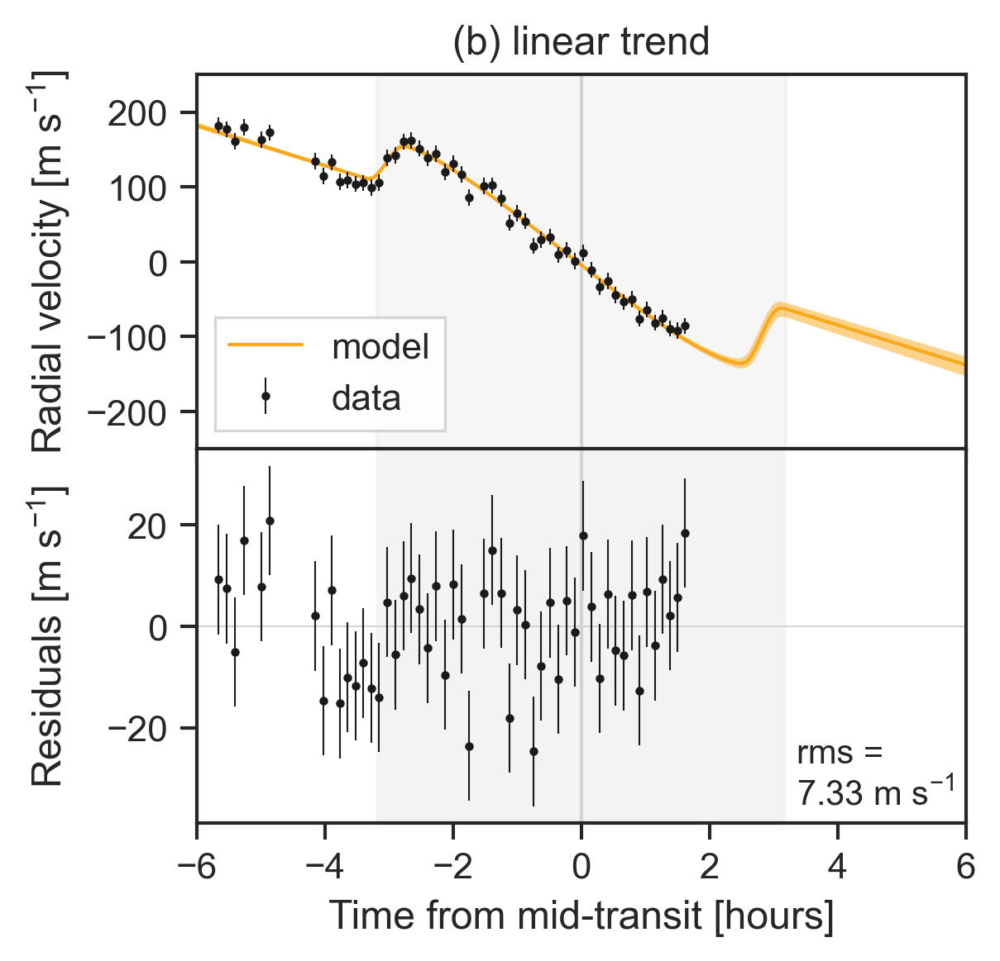

In [450]:
plot_rm_trace(trace_line, text='(b) linear trend', mcolor='C1')

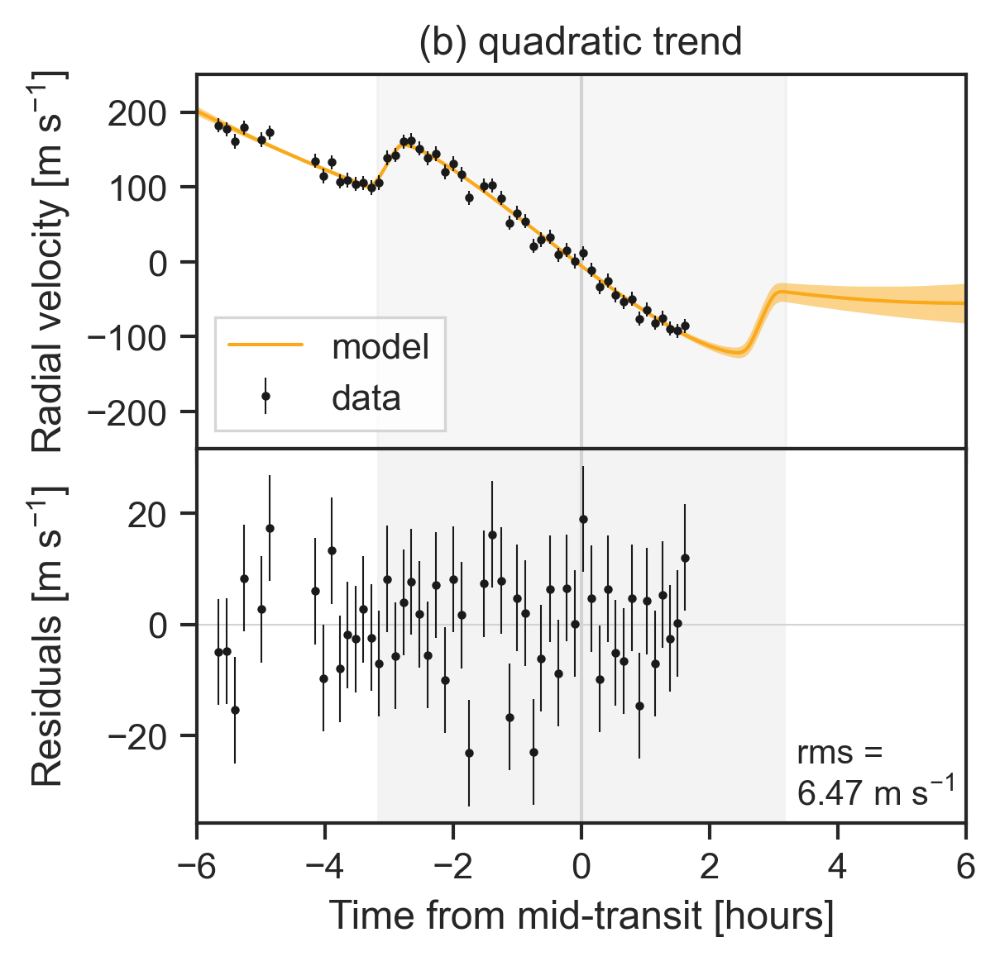

In [376]:
plot_rm_trace(trace_quad, text='(b) quadratic trend', mcolor='C1')

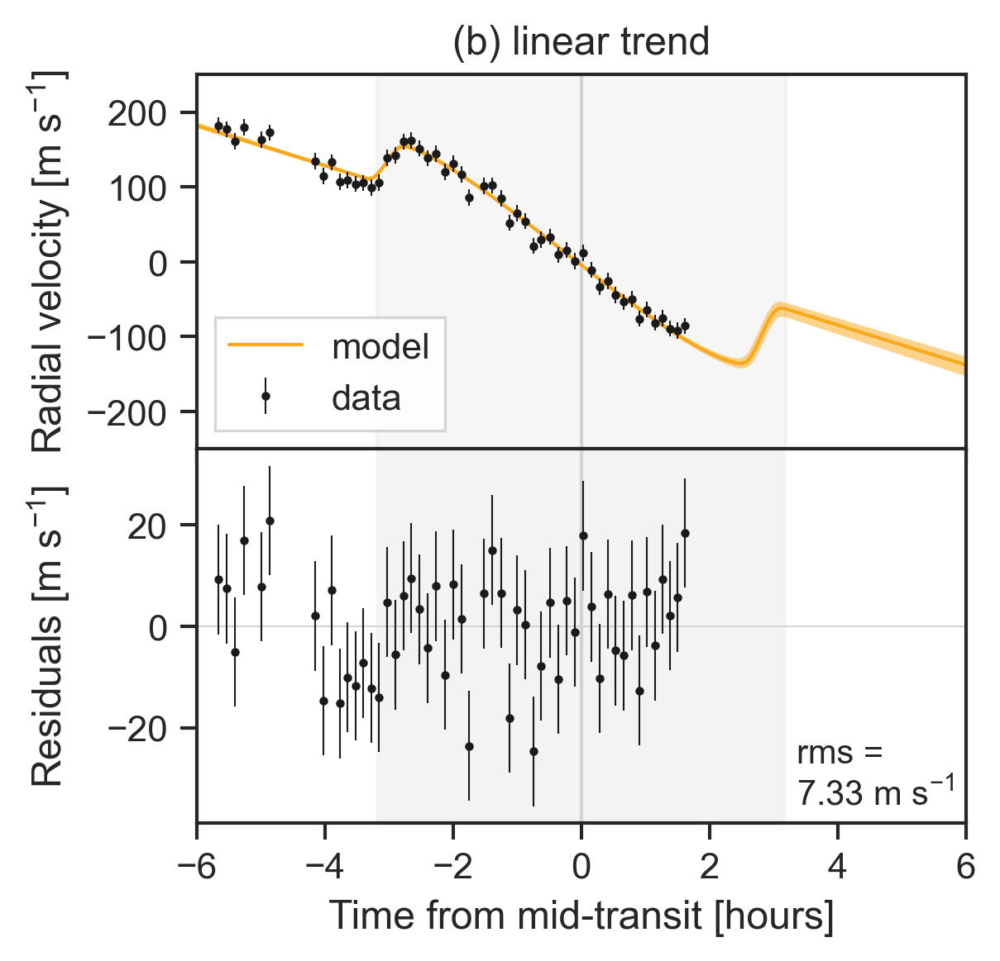

In [378]:
trace_line = pm.load_trace(directory="./line/", model=model_line)
plot_rm_trace(trace_line, text='(b) linear trend', mcolor='C1')

In [402]:
trace_quad.

<MultiTrace: 2 chains, 2000 iterations, 54 variables>

In [364]:
trace_line_protprio = pm.load_trace(directory="./line_protprio/", model=model_line_protprio)
trace_quad_protprio = pm.load_trace(directory="./quad_protprio/", model=model_quad_protprio)
trace_gp_protprio_hires = pm.load_trace(directory="./gp_protprio_hires/", model=model_gp_protprio_hires)

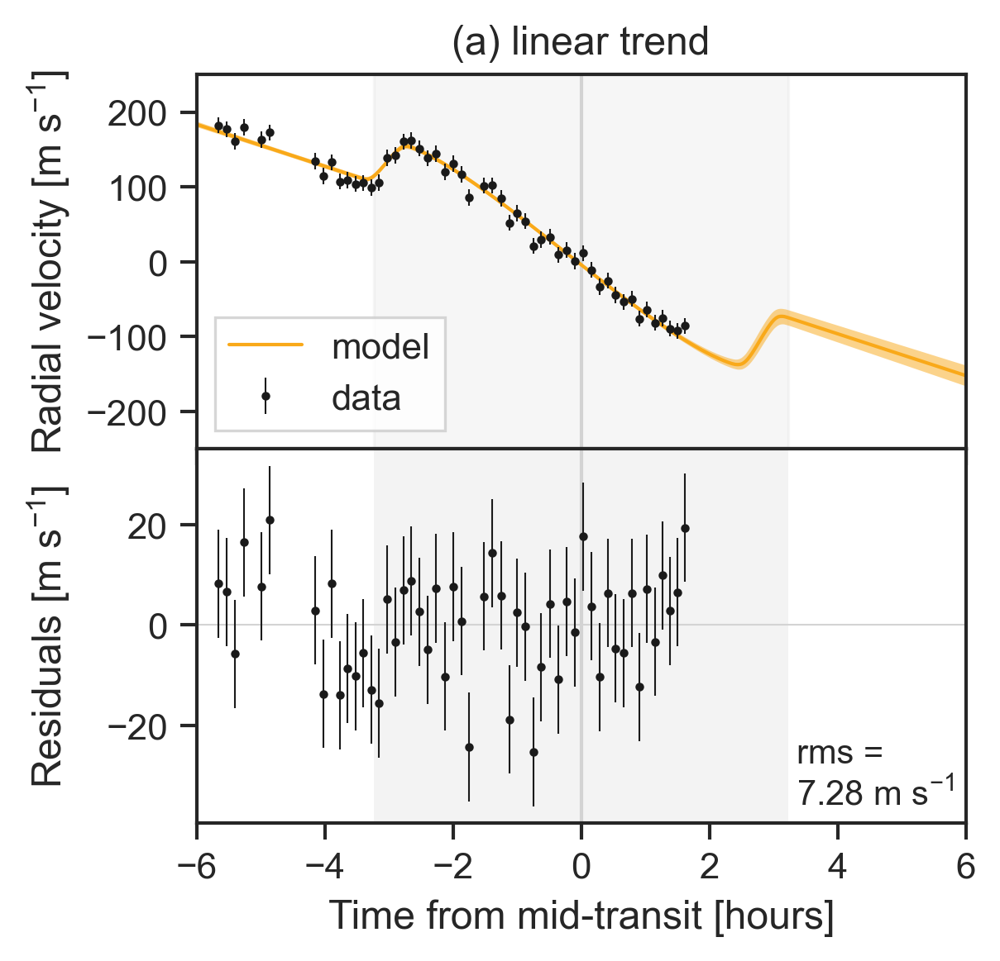

In [354]:
plot_rm_trace(trace_line_protprio, text='(a) linear trend', mcolor='C1', savefig='./figures/rm_line_protprio.pdf')

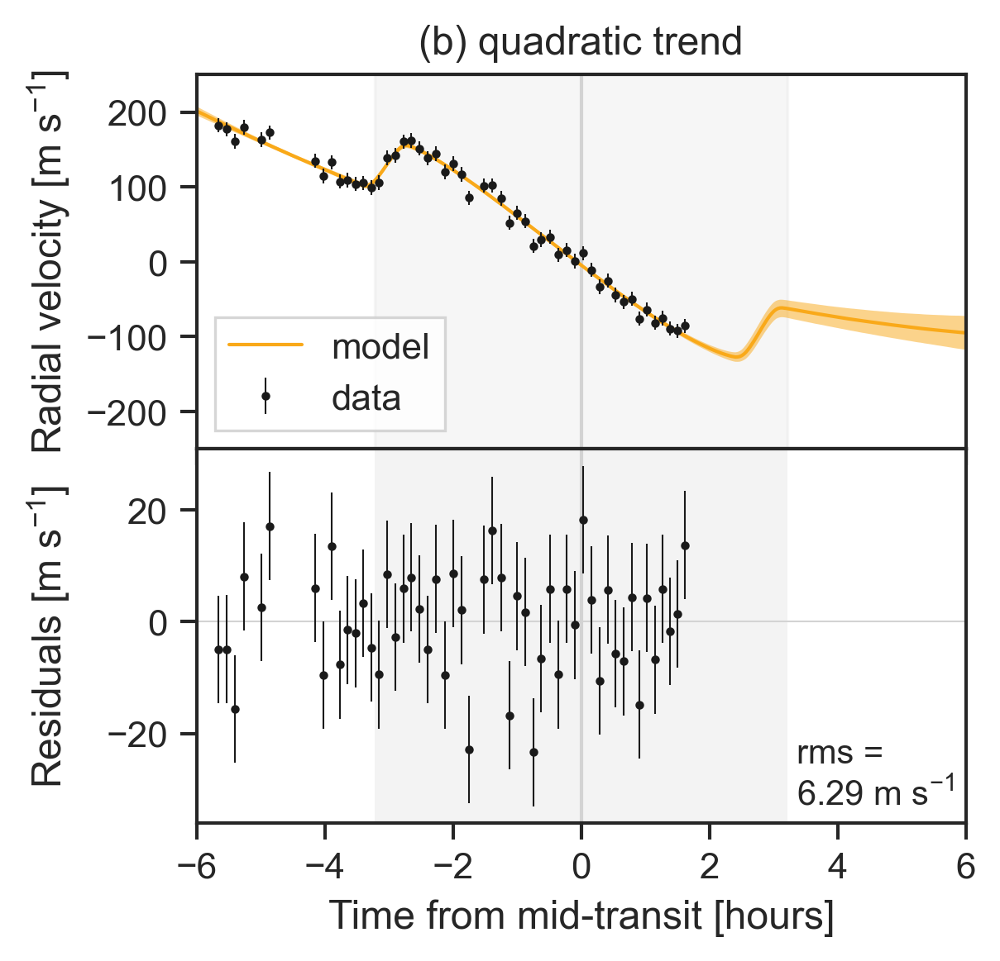

In [355]:
plot_rm_trace(trace_quad_protprio, text='(b) quadratic trend', mcolor='C1', savefig='./figures/rm_quad_protprio.pdf')

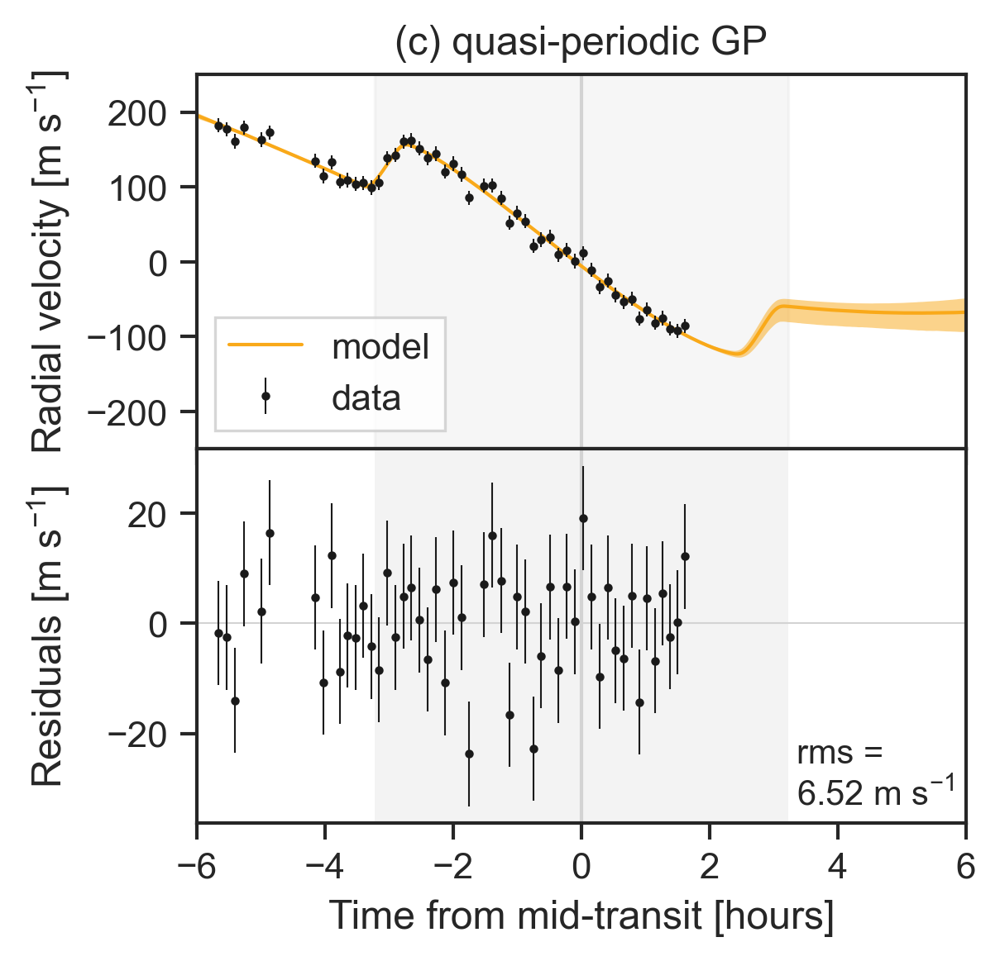

In [366]:
plot_rm_trace(trace_gp_protprio_hires, text='(c) quasi-periodic GP', mcolor='C1', gp=True, savefig='./figures/rm_gp_protprio.pdf')

In [394]:
trace_gp = pm.load_trace(directory="./gp/", model=model_gp)
trace_gp_protprio = pm.load_trace(directory="./gp_protprio/", model=model_gp_protprio)

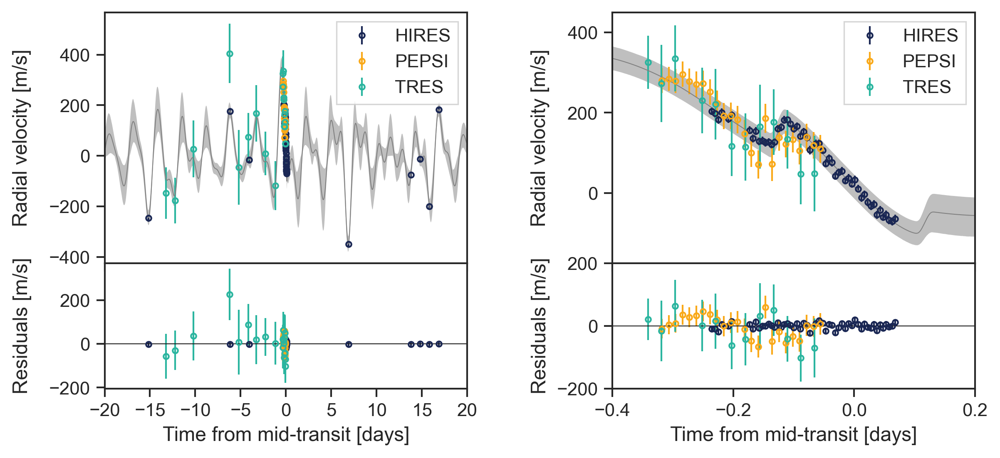

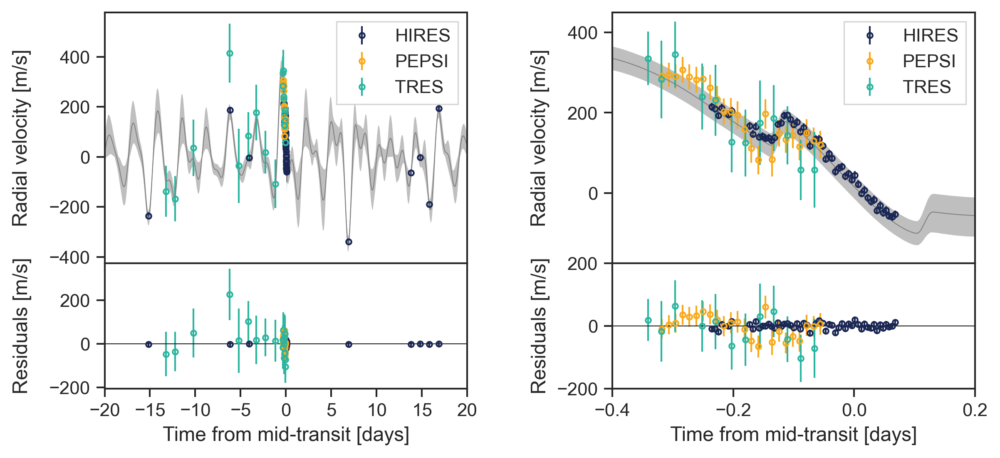

In [397]:
plot_gp_trace(trace_gp, mask=all_rm)
#plot_gp_trace(trace_gp, mask=all_rm, figpath="./figures/gp-rm-fit.pdf")
plot_gp_trace(trace_gp_protprio, mask=all_rm)
#plot_gp_trace(trace_gp_hires, model_gp_hires, mask=hires_rm)

# print(np.shape(trace_gp["mean_rv"]))
# print(np.shape(trace_gp["rm_curve"]))
# print(np.shape(trace_gp["gp_rv"]))

In [ ]:
#     #     plt.hist(tr["obliquity"], 
#     #              bins=np.linspace(-180,180,200), 
#     #              histtype='step', 
#     #              density=True, 
#     #              lw=1, 
#     #              alpha=0.3,
#     #              label=labels[i])

#         angle = np.linspace(-180,180,1000)
        
#         kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(tr["obliquity"][:, np.newaxis])
#         log_dens = kde.score_samples(angle[:, np.newaxis])
#         ax1.plot(angle, np.exp(log_dens), lw=2, ls=linestyles[i%2], color=colors[i], label=labels[i])

In [ ]:
trace_quad_protprio = sample_model(model_quad_protprio, start=map_soln_quad_protprio)
trace_gp_protprio = sample_model(model_gp_protprio, start=map_soln_gp_protprio)
trace_gp_protprio_hires = sample_model(model_gp_protprio_hires, start=map_soln_gp_protprio_hires)

In [ ]:
trace_line = sample_model(model_line, start=map_soln_line)
trace_quad = sample_model(model_quad, start=map_soln_quad)
trace_gp = sample_model(model_gp, start=map_soln_gp)
trace_gp_hires = sample_model(model_gp_hires, start=map_soln_gp_hires)

Sequential sampling (2 chains in 1 job)
NUTS: [c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 7500/7500 [1:12:20<00:00,  1.73it/s] 
The number of effective samples is smaller than 25% for some parameters.


Time elapsed: 677.6677540024122  minutes


Sequential sampling (2 chains in 1 job)
NUTS: [c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 7500/7500 [20:46<00:00,  6.02it/s]


Time elapsed: 48.26464446783066  minutes


Sequential sampling (2 chains in 1 job)
NUTS: [mix, log_deltaQ, log_Q0, log_amp, mean_pepsi, mean_tres, mean_hires, logs_rv_pepsi, logs_rv_tres, logs_rv_hires, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 0, 0 divergences:  30%|███       | 2274/7500 [13:22<16:28,  5.29it/s]  

In [176]:
print_report(trace_quad, 'obliquity')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


\begin{tabular}{lrrrrrrrrrrr}
\toprule
{} &     mean &        sd &     hdi\_3\% &   hdi\_97\% &  mcse\_mean &   mcse\_sd &     ess\_mean &      ess\_sd &     ess\_bulk &    ess\_tail &     r\_hat \\
\midrule
obliquity & -9.25952 &  7.897457 & -22.928971 &  5.505138 &   0.245324 &  0.213019 &  1036.323572 &  687.824795 &  1350.380901 &  884.615304 &  1.001218 \\
\bottomrule
\end{tabular}



In [177]:
print_report(trace_gp_protprio_hires, 'obliquity')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


\begin{tabular}{lrrrrrrrrrrr}
\toprule
{} &     mean &         sd &     hdi\_3\% &    hdi\_97\% &  mcse\_mean &   mcse\_sd &     ess\_mean &       ess\_sd &     ess\_bulk &     ess\_tail &    r\_hat \\
\midrule
obliquity &  7.58381 &  15.502657 & -13.715908 &  41.963659 &   0.448925 &  0.340088 &  1192.514726 &  1039.546619 &  2115.673414 &  1232.884293 &  1.00024 \\
\bottomrule
\end{tabular}



In [102]:
print_report(trace_quad_protprio, 'obliquity')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


\begin{tabular}{lrrrrrrrrrrr}
\toprule
{} &      mean &        sd &     hdi\_3\% &    hdi\_97\% &  mcse\_mean &   mcse\_sd &     ess\_mean &       ess\_sd &     ess\_bulk &     ess\_tail &     r\_hat \\
\midrule
obliquity & -0.215394 &  5.832596 & -10.956899 &  10.520756 &   0.108311 &  0.116041 &  2899.853826 &  1263.776466 &  3424.262768 &  2158.364788 &  1.000104 \\
\bottomrule
\end{tabular}



In [103]:
print_report(trace_gp, 'obliquity')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


\begin{tabular}{lrrrrrrrrrrr}
\toprule
{} &       mean &         sd &     hdi\_3\% &    hdi\_97\% &  mcse\_mean &   mcse\_sd &    ess\_mean &      ess\_sd &     ess\_bulk &     ess\_tail &     r\_hat \\
\midrule
obliquity &  14.720382 &  23.503955 & -17.485208 &  61.080826 &   0.749973 &  0.533102 &  982.178345 &  972.504642 &  1314.320768 &  2749.709174 &  1.001778 \\
\bottomrule
\end{tabular}



In [104]:
print_report(trace_gp_protprio, 'obliquity')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


\begin{tabular}{lrrrrrrrrrrr}
\toprule
{} &      mean &         sd &    hdi\_3\% &    hdi\_97\% &  mcse\_mean &   mcse\_sd &     ess\_mean &       ess\_sd &     ess\_bulk &     ess\_tail &     r\_hat \\
\midrule
obliquity &  15.85109 &  18.850956 & -11.03285 &  56.923546 &   0.513077 &  0.390261 &  1349.900826 &  1167.197689 &  1852.201255 &  2145.992826 &  1.000448 \\
\bottomrule
\end{tabular}



In [86]:
#Model comparison move this down

# quad_loo = az.loo(trace_quad, model_quad, var_name='obs')
# print(quad_loo.loo)

# quad_protprio_loo = az.loo(trace_quad_protprio, model_quad_protprio, var_name='obs')
# print(quad_protprio_loo.loo)

# gp_protprio_hires_loo = az.loo(trace_gp_protprio_hires, model_gp_protprio_hires, var_name='obs')
# print(gp_protprio_hires_loo.loo)

#idata = az.from_pymc3(trace_quad, model=model_quad)
#idata2 = az.from_pymc3(trace_quad_protprio, model=model_quad_protprio)
# compare_dict = {"quad": idata, "quad_protprio": idata2}
# az.compare(compare_dict)

# df_comp = az.compare({"quad": trace_quad, "quad_protprio": trace_quad_protprio}, ic='loo')
# df_comp

# gp_protprio_loo = az.loo(trace_gp_protprio, model_gp_protprio, var_name='obs')
# print(gp_protprio_loo.loo)

# gp_hires_loo = az.loo(trace_gp_hires, model_gp_hires, var_name='obs')
# print(gp_hires_loo.loo)


# for tr in [trace_quad, 
#            trace_quad_protprio, 
#            #trace_gp, 
#            #trace_gp_protprio, 
#            trace_gp_protprio_hires,
#            trace_gp_hires]:
#     print(np.max(tr.model_logp))

In [105]:
print_report(trace_gp_hires, 'obliquity')

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


\begin{tabular}{lrrrrrrrrrrr}
\toprule
{} &      mean &         sd &     hdi\_3\% &    hdi\_97\% &  mcse\_mean &   mcse\_sd &    ess\_mean &      ess\_sd &    ess\_bulk &     ess\_tail &     r\_hat \\
\midrule
obliquity &  5.375237 &  22.884922 & -21.256353 &  57.556297 &   1.155432 &  0.817622 &  392.292712 &  392.292712 &  638.098465 &  1304.646837 &  1.002114 \\
\bottomrule
\end{tabular}



In [97]:
# var_names=[
#  'period',
#  't0',
#  'ror',
#  'mean_ktwo',
#  'mean_spitz',
#  'logs_rv',
#  'm_star',
#  'r_star',
#  'r_pl',
#  'ror',
#  'b',
#  'prot_model',
#  'u_star',
#  'u_star_ir',
#  'jit_spitz',
#  'vsini',
#  'cosi_st',
#  'sini_st',
#  'i_st',
#  'veq',
#  'a_r',
#  'cosi_pl',
#  'i_pl_deg',
#  'obliquity',
# ]

var_names=[
 'period',
 'i_pl_deg',
 'obliquity',
]

pm.summary(trace_quad_protprio, var_names=var_names, round_to=4)

/Users/tdavid/anaconda3/lib/python3.7/site-packages/arviz/data/io_pymc3.py:91: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%
period,24.1413,0.0000,24.1413,24.1414
i_pl_deg,88.7544,0.0766,88.6075,88.8904
obliquity,-0.2154,5.8326,-10.9569,10.5208


In [328]:
#trace_cube = sample_model(model_cube, start=map_soln_cube, tune=2500, draws=2000, chains=2, target_accept=0.95)

Sequential sampling (2 chains in 1 job)
NUTS: [c3, c2, c1, c0, logs_rv, obliquity_rad, cosi_st, vsini, logjit_ktwo, logjit_spitz, mean_spitz, mean_ktwo, u_star_ir, u_star, b, ror, t0, period, r_star, m_star]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [17:40<00:00,  4.24it/s]
The number of effective samples is smaller than 25% for some parameters.


Time elapsed: 47.528200550874075  minutes


In [114]:
# print('Linear RV trend model')
# divergent = trace_line['diverging']
# print('Number of Divergent %d' % divergent.nonzero()[0].size)
# divperc = divergent.nonzero()[0].size/len(trace_line)
# print('Percentage of Divergent %.5f' % divperc)

print('Quadratic RV trend model')
divergent = trace_quad['diverging']
print('Number of Divergent %d' % divergent.nonzero()[0].size)
divperc = divergent.nonzero()[0].size/len(trace_quad)
print('Percentage of Divergent %.5f' % divperc)

# print('Linear RV trend model (Prot prior)')
# divergent = trace_line_protprio['diverging']
# print('Number of Divergent %d' % divergent.nonzero()[0].size)
# divperc = divergent.nonzero()[0].size/len(trace_line_protprio)
# print('Percentage of Divergent %.5f' % divperc)

print('Quadratic RV trend model (Prot prior)')
divergent = trace_quad_protprio['diverging']
print('Number of Divergent %d' % divergent.nonzero()[0].size)
divperc = divergent.nonzero()[0].size/len(trace_quad_protprio)
print('Percentage of Divergent %.5f' % divperc)

print('GP RV trend model')
divergent = trace_gp['diverging']
print('Number of Divergent %d' % divergent.nonzero()[0].size)
divperc = divergent.nonzero()[0].size/len(trace_gp)
print('Percentage of Divergent %.5f' % divperc)

print('GP RV trend model (Prot prior)')
divergent = trace_gp_protprio['diverging']
print('Number of Divergent %d' % divergent.nonzero()[0].size)
divperc = divergent.nonzero()[0].size/len(trace_gp_protprio)
print('Percentage of Divergent %.5f' % divperc)

Quadratic RV trend model
Number of Divergent 0
Percentage of Divergent 0.00000
Quadratic RV trend model (Prot prior)
Number of Divergent 0
Percentage of Divergent 0.00000
GP RV trend model
Number of Divergent 0
Percentage of Divergent 0.00000
GP RV trend model (Prot prior)
Number of Divergent 0
Percentage of Divergent 0.00000


In [100]:
# # A wrapper function to report trace diagnostics taken from:
# # https://pymc3-testing.readthedocs.io/en/rtd-docs/notebooks/Diagnosing_biased_Inference_with_Divergences.html

# def report_trace(trace):
#     # plot the trace of log(tau)
#     pm.traceplot(trace, varnames=['tau_log_'])

#     # plot the estimate for the mean of log(τ) cumulating mean
#     logtau = trace['tau_log_']
#     mlogtau = [np.mean(logtau[:i]) for i in np.arange(1, len(logtau))]
#     plt.figure(figsize=(15, 4))
#     plt.axhline(0.7657852, lw=2.5, color='gray')
#     plt.plot(mlogtau, lw=2.5)
#     plt.ylim(0, 2)
#     plt.xlabel('Iteration')
#     plt.ylabel('MCMC mean of log(tau)')
#     plt.title('MCMC estimation of log(tau)')
#     plt.show()

#     # display the total number and percentage of divergent
#     divergent = trace['diverging']
#     print('Number of Divergent %d' % divergent.nonzero()[0].size)
#     divperc = divergent.nonzero()[0].size/len(trace)
#     print('Percentage of Divergent %.5f' % divperc)

#     # scatter plot between log(tau) and theta[0]
#     # for the identifcation of the problematic neighborhoods in parameter space
#     theta_trace = trace['theta']
#     theta0 = theta_trace[:, 0]
#     plt.figure(figsize=(10, 6))
#     plt.scatter(theta0[divergent == 0], logtau[divergent == 0], color='r')
#     plt.scatter(theta0[divergent == 1], logtau[divergent == 1], color='g')
#     plt.axis([-20, 50, -6, 4])
#     plt.ylabel('log(tau)')
#     plt.xlabel('theta[0]')
#     plt.title('scatter plot between log(tau) and theta[1]')
#     plt.show()

Before looking at the results, let's diagnose the health of our sampler

/Users/tdavid/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
/Users/tdavid/anaconda3/lib/python3.7/site-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


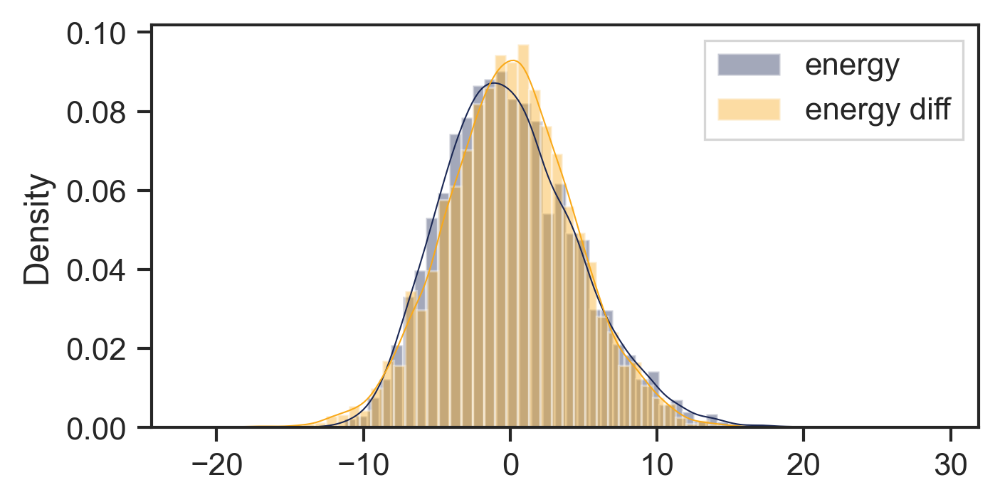

In [102]:
#for trace in [trace_line, trace_quad, trace_line_protprio, trace_quad_protprio]:
for trace in [trace_line_protprio]:
    energy = trace['energy']
    energy_diff = np.diff(energy)
    sns.distplot(energy - energy.mean(), label='energy')
    sns.distplot(energy_diff, label='energy diff')
    plt.legend()
    plt.gcf().set_size_inches(5,2.5)
    plt.show()

In [103]:
trace.stat_names

{'depth',
 'diverging',
 'energy',
 'energy_error',
 'max_energy_error',
 'mean_tree_accept',
 'model_logp',
 'step_size',
 'step_size_bar',
 'tree_size',
 'tune'}

In [181]:
#maxlogp = np.argmax(trace_line['model_logp'])
#print(trace_line['obliquity'][maxlogp])
#print(trace_line['model_logp'][maxlogp])

maxlogp = np.argmax(trace_quad['model_logp'])
print(trace_quad['obliquity'][maxlogp])
print(trace_quad['model_logp'][maxlogp])

# maxlogp = np.argmax(trace_line_protprio['model_logp'])
# print(trace_line_protprio['obliquity'][maxlogp])
# print(trace_line_protprio['model_logp'][maxlogp])

maxlogp = np.argmax(trace_quad_protprio['model_logp'])
print(trace_quad_protprio['obliquity'][maxlogp])
print(trace_quad_protprio['model_logp'][maxlogp])

maxlogp = np.argmax(trace_gp_protprio_hires['model_logp'])
print(trace_gp_protprio_hires['obliquity'][maxlogp])
print(trace_gp_protprio_hires['model_logp'][maxlogp])

#denom = np.max(trace_line['model_logp'])
denom = np.max(trace_quad['model_logp'])

#trace_line, trace_line_protprio, 

for tr in [trace_quad, trace_quad_protprio,
           trace_gp, trace_gp_protprio, trace_gp_hires, trace_gp_protprio_hires]:
    print(np.max(tr['model_logp'])/denom)


# print('Linear Bayes factor:', np.max(trace_line['model_logp'])/denom)
# print('Quad Bayes factor:', np.max(trace_quad['model_logp'])/denom)
# print('Linear Prot prior Bayes factor:', np.max(trace_line_protprio['model_logp'])/denom)
# print('Quad Prot prior Bayes factor:', np.max(trace_quad_protprio['model_logp'])/denom)

-11.865105945731404
-557.9874269316042
-4.703398927472379
-559.0064985673002
15.792252982971553
-549.5972399382565
1.0
1.0018263344055975
1.5359073826973082
1.5356622924459864
0.98379862120905
0.98496348378406


### Print the trace summary

#### Let's run some diagnostic tests on the trace

In [161]:
#textable = pm.summary(trace_line, var_names=var_names, round_to=6, credible_interval=0.68, fmt='wide').to_latex(index=False)

### Corner plots

In [124]:
import corner

sns.set(font_scale=1.1) 

varnames = ["obliquity", "b", "vsini", "prot_model", "ror"]
varlabels = ["$\mathregular{\lambda}$ [deg]", "b", "vsini [km/s]", "Prot [d]", "$\mathregular{R_P/R_\star}$"]

trace_list = [trace_line, trace_line_protprio, 
           trace_quad, trace_quad_protprio,
           trace_gp, trace_gp_protprio]

for i,tr in enumerate(trace_list):
    if i<2:
        _varnames = np.append(varnames, ["c0","c1"])
        _varlabels = np.append(varlabels, ["$\mathregular{c_0}$", 
                                           "$\mathregular{c_1}$"])
    elif (i>=2) & (i<4):
        _varnames = np.append(varnames, ["c0","c1","c2"])
        _varlabels = np.append(varlabels, ["$\mathregular{c_0}$", 
                                           "$\mathregular{c_1}$",
                                           "$\mathregular{c_2}$"])
    elif (i>=4):
        _varnames = np.append(varnames, ["log_amp","log_Q0","log_deltaQ","mix"])
        _varlabels = np.append(varlabels, ["$\mathregular{ln(amp)}$", 
                                           "$\mathregular{ln(Q_0)}$",
                                           "$\mathregular{ln(\Delta Q)}$",
                                           "mix"])
        
        
    
    samples = pm.trace_to_dataframe(tr, varnames=_varnames)
    fig = corner.corner(samples, labels=_varlabels)
    plt.savefig('/Users/tdavid/Desktop/corner'+str(i+1)+'.pdf');
    plt.clf()

<Figure size 2400x2400 with 0 Axes>

<Figure size 2400x2400 with 0 Axes>

<Figure size 2715x2715 with 0 Axes>

<Figure size 2715x2715 with 0 Axes>

<Figure size 3030x3030 with 0 Axes>

<Figure size 3030x3030 with 0 Axes>

In [159]:
#pm.traceplot(trace_line, varnames=['obliquity'])

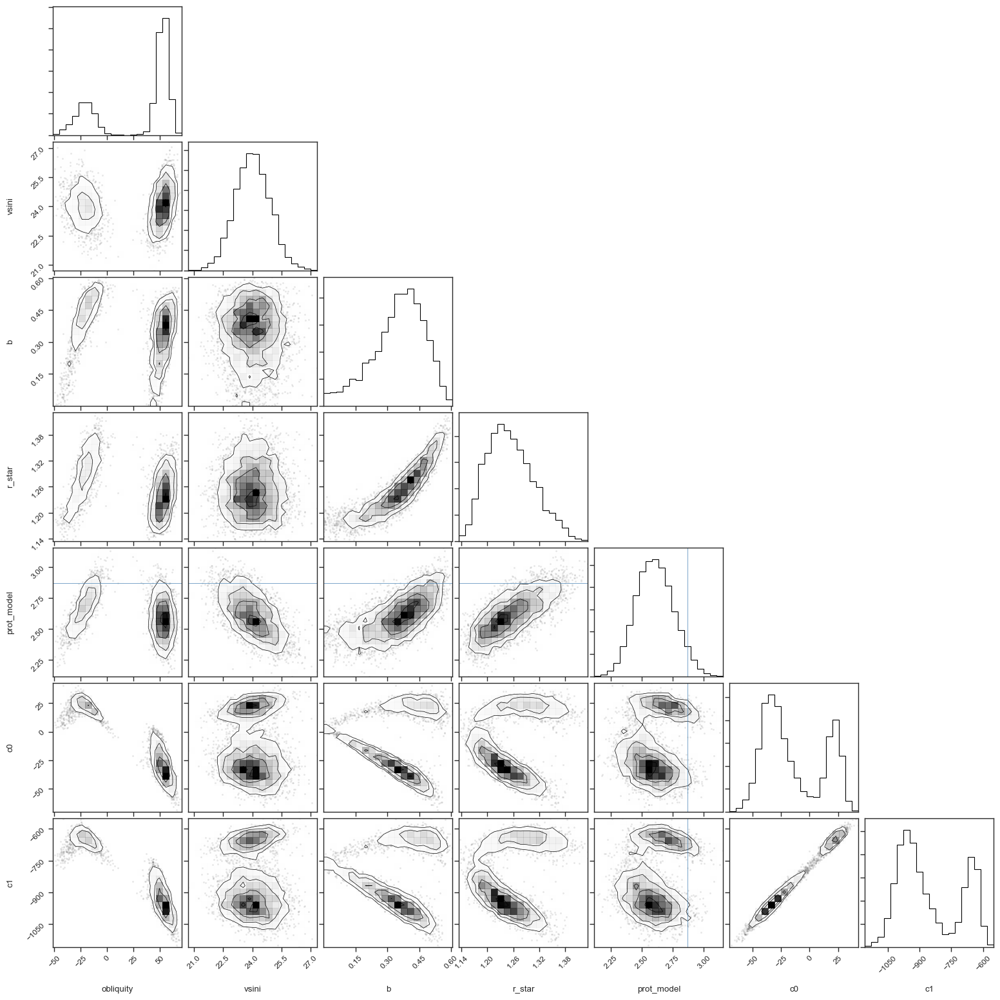

In [48]:
varnames = ["obliquity", "vsini", "b", "r_star", "prot_model", "c0", "c1"]
samples = pm.trace_to_dataframe(trace_line, varnames=varnames)
fig = corner.corner(samples,truths=[None,None,None,None,2.87,None,None]);

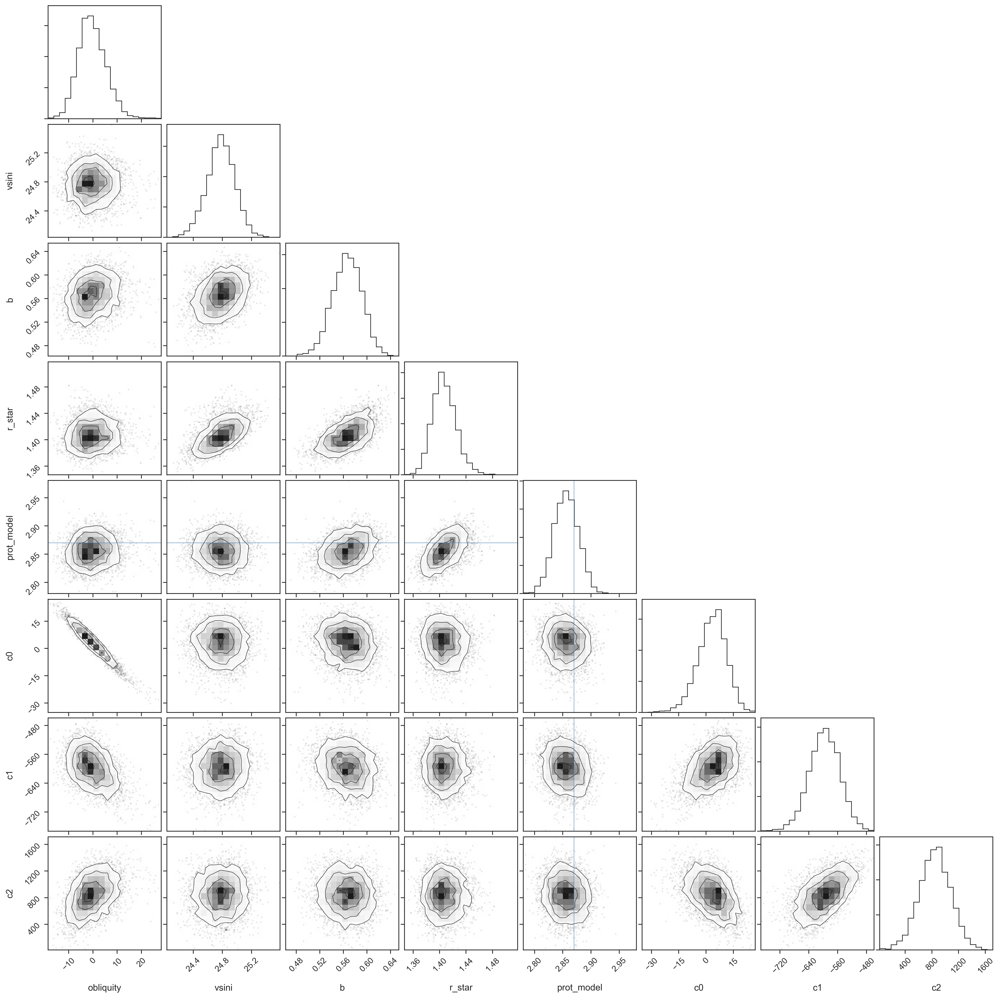

In [112]:
varnames = ["obliquity", "vsini", "b", "r_star", "prot_model", "c0", "c1", "c2"]
samples = pm.trace_to_dataframe(trace_quad_protprio, varnames=varnames)
fig = corner.corner(samples,truths=[None,None,None,None,2.87,None,None,None]);
#plt.savefig('./figures/v1298tau-rm-linear-corner.pdf')

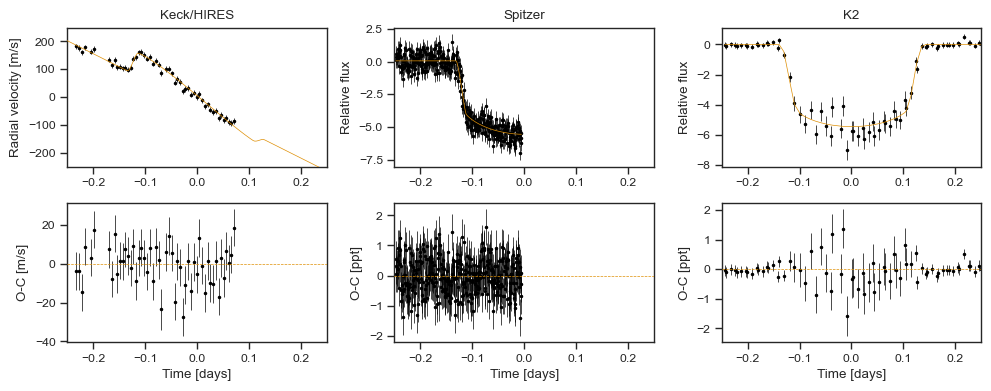

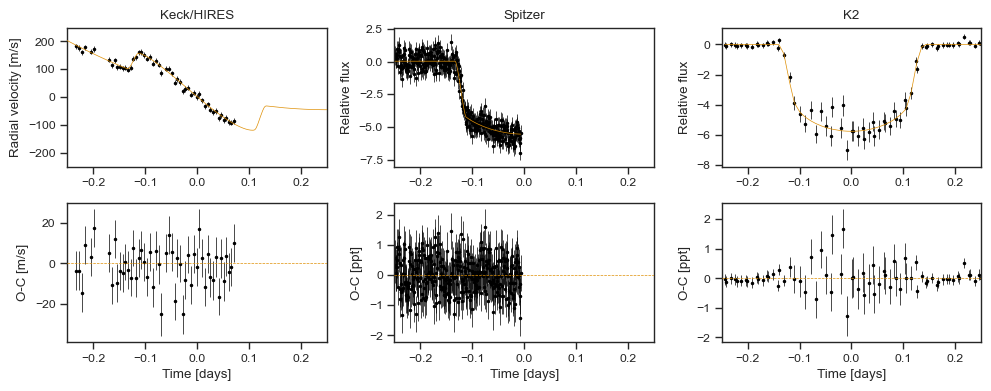

In [49]:
def plot_maxlogp_soln(trace, savefig=False):
    
    maxlogp = np.argmax(trace['model_logp'])
    
    time_hires = np.linspace(-0.25,0.25,int(1e3))
    tfmt_hires = ((hires_time-trace['t0'][maxlogp]-0.5*trace['period'][maxlogp])%trace['period'][maxlogp]) - 0.5*trace['period'][maxlogp]

    lc_tfmt = ((ktwo_time-trace['t0'][maxlogp]-0.5*trace['period'][maxlogp])%trace['period'][maxlogp]) - 0.5*trace['period'][maxlogp]
    spitz_tfmt = ((spitz_time-trace['t0'][maxlogp]-0.5*trace['period'][maxlogp])%trace['period'][maxlogp]) - 0.5*trace['period'][maxlogp]
    
    arg = np.argsort(lc_tfmt)
    arg = np.argsort(tfmt_hires)

    fig, (ax1,ax2) = plt.subplots(nrows=2, ncols=3, figsize=(10,4))

    ax1[0].set_title("Keck/HIRES")
    ax1[0].errorbar(hires_time, hires_rv, yerr=trace["err_rv"][maxlogp], color='k', fmt='.')
    ax1[0].plot(t_rv, trace["rv_model_pred"][maxlogp], "C1-", zorder=999)
    #ax1[0].plot(t_rv, trace["rv_trend_hires"], "--", color='grey', lw=0.5, zorder=999)
    ax1[0].set_ylabel('Radial velocity [m/s]')
    ax1[0].set_xlim(-0.25,0.25)
    ax1[0].set_ylim(-250,250)

    ax2[0].axhline(0, color="C1", ls='--', zorder=999)
    ax2[0].errorbar(hires_time, hires_rv-trace["rv_model"][maxlogp], yerr=trace["err_rv"][maxlogp], color='k', fmt='.')
    ax2[0].set_xlabel('Time [days]')
    ax2[0].set_ylabel(r'O-C [m/s]')
    ax2[0].set_xlim(-0.25,0.25)

    ax1[1].set_title("Spitzer")
    ax1[1].errorbar(spitz_tfmt, spitz_flux, yerr=trace["err_spitz"][maxlogp], color='k', fmt='.')
    ax1[1].plot(spitz_tfmt, trace["light_curve_spitz"][maxlogp], "C1-", zorder=999)
    ax1[1].set_ylabel('Relative flux')
    ax1[1].set_xlim(-0.25,0.25)

    ax2[1].axhline(0, color="C1", ls='--', zorder=999)
    ax2[1].errorbar(spitz_tfmt, (spitz_flux-trace["light_curve_spitz"][maxlogp]), yerr=trace["err_spitz"][maxlogp], color='k', fmt='.')
    ax2[1].set_xlabel('Time [days]')
    ax2[1].set_ylabel(r'O-C [ppt]')
    ax2[1].set_xlim(-0.25,0.25)

    ax1[2].set_title("K2")
    ind = np.argsort(ktwo_tfmt)
    ax1[2].errorbar(ktwo_tfmt, ktwo_flux, yerr=trace["err_ktwo"][maxlogp], color='k', fmt='.')
    ax1[2].plot(ktwo_tfmt[ind], trace["light_curve"][maxlogp][ind], "C1-", zorder=999)
    ax1[2].set_ylabel('Relative flux')
    ax1[2].set_xlim(-0.25,0.25)

    ax2[2].axhline(0, color="C1", ls='--', zorder=999)
    ax2[2].errorbar(ktwo_tfmt, (ktwo_flux-trace["light_curve"][maxlogp]), yerr=trace["err_ktwo"][maxlogp], color='k', fmt='.')
    ax2[2].set_xlabel('Time [days]')
    ax2[2].set_ylabel(r'O-C [ppt]')
    ax2[2].set_xlim(-0.25,0.25)

    plt.tight_layout()
    if savefig==True:
        plt.savefig('./figures/v1298tau-rm-linear-maxlogp-soln.pdf', bbox_inches='tight')
    plt.show()
    
    return

plot_maxlogp_soln(trace_line)
plot_maxlogp_soln(trace_quad)

ValueError: x and y must have same first dimension, but have shapes (2000,) and (1000,)

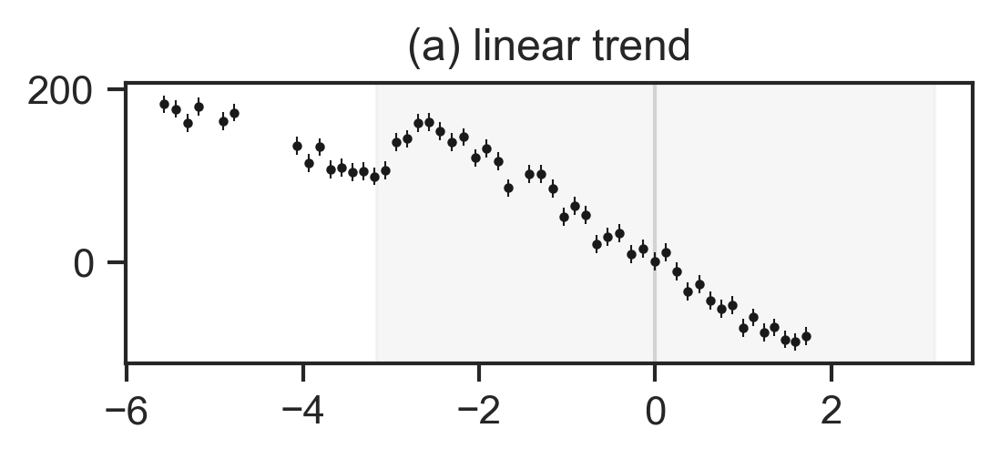

In [319]:
%config InlineBackend.figure_format = "retina"

# plot_rm_trace(trace_line, savefig='./figures/v1298tau-rm-line.pdf', text='(a) linear trend')
# plot_rm_trace(trace_quad, savefig='./figures/v1298tau-rm-quad.pdf', text='(b) quadratic trend')

plot_rm_trace(trace_line, text='(a) linear trend', mcolor='#f9a11b')
#plot_rm_trace(trace_line_protprio, text='(a) linear trend + concentrated Prot prior', mcolor='#f9a11b')
plot_rm_trace(trace_quad, text='(b) quadratic trend', mcolor='#f9a11b')
#plot_rm_trace(trace_quad_protprio, text='(b) quadratic trend + concentrated Prot prior', mcolor='#f9a11b')

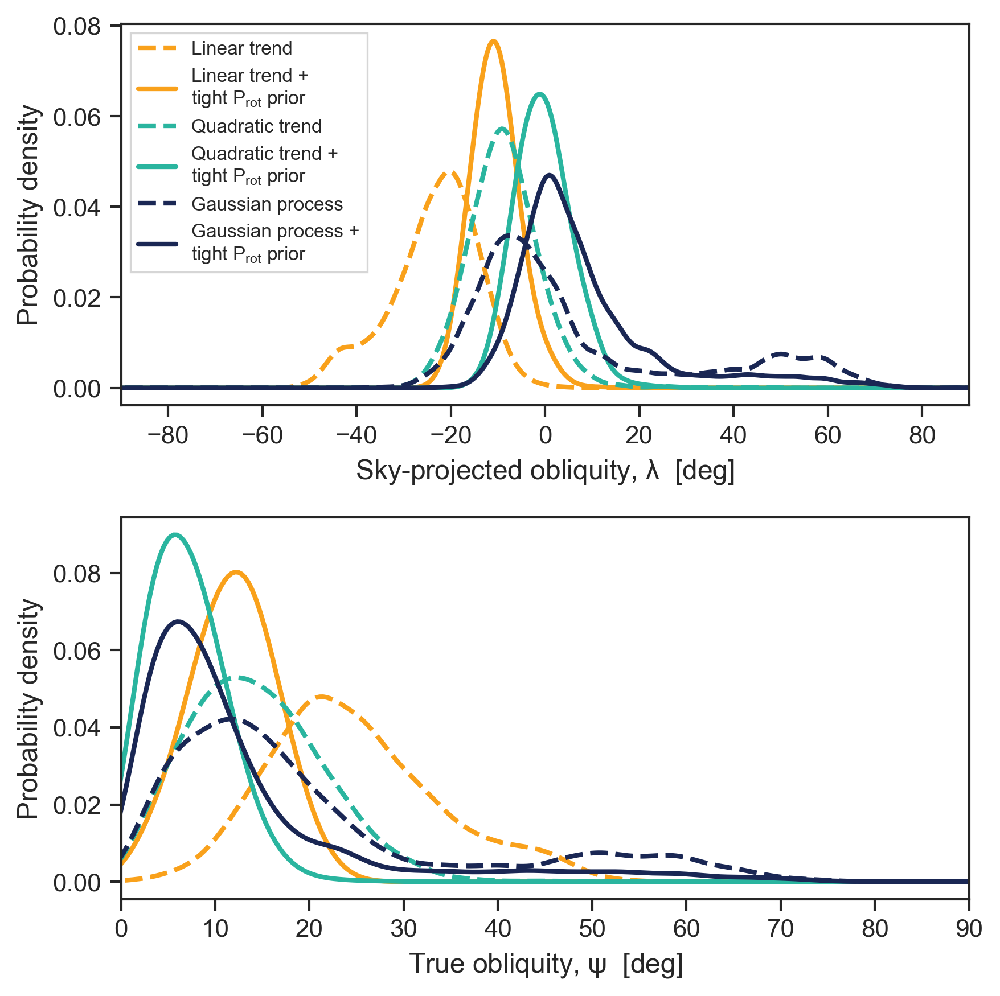

In [465]:
def plot_posterior_comparison(figpath=None, bandwidth=2, hist=False):
    #sns.set_palette(sns.color_palette("husl", 6))
    #sns.set_palette(sns.color_palette("flare", 3))
    #sns.set_palette("tab10")
    #sns.set_palette("rocket")
    linestyles = ["--","-"]
    #colors = sns.color_palette("cubehelix",3)
    colors = ['#f9a11b','#f9a11b', '#2ab59f', '#2ab59f', '#1a2754', '#1a2754']
    
    fig,(ax1,ax2) = plt.subplots(nrows=2, ncols=1, figsize=(6,6))
    
    labels = ['Linear trend',
              'Linear trend +\ntight P$_\mathregular{rot}$ prior',
              'Quadratic trend',
              'Quadratic trend +\ntight P$_\mathregular{rot}$ prior',
              'Gaussian process',              
              'Gaussian process +\ntight P$_\mathregular{rot}$ prior',]
    
#     for i,tr in enumerate([trace_line, trace_line_protprio,
#                            trace_quad, trace_quad_protprio,
#                            trace_gp, trace_gp_protprio]):
    for i,tr in enumerate([trace_line, trace_line_protprio,
                           trace_quad, trace_quad_protprio,
                           trace_gp_hires, trace_gp_protprio_hires]):

        
        
        psi = true_psi(tr['i_st'], tr['i_pl_deg'], tr['obliquity'])
        

        angle = np.linspace(-180,180,1000)
            
        kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(tr["obliquity"][:, np.newaxis])
        log_dens = kde.score_samples(angle[:, np.newaxis])
        ax1.plot(angle, np.exp(log_dens), lw=2, ls=linestyles[i%2], color=colors[i], label=labels[i])

        kde_psi = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(psi[:, np.newaxis])
        log_dens_psi = kde_psi.score_samples(angle[:, np.newaxis])
        ax2.plot(angle, np.exp(log_dens_psi), lw=2, ls=linestyles[i%2], color=colors[i], label=labels[i])
        
        if hist==True:
            ax1.hist(tr['obliquity'], bins=np.linspace(-180,180,200), histtype='step', lw=2, ls=linestyles[i%2], color=colors[i], density=True)
            ax2.hist(psi, bins=np.linspace(-180,180,200), histtype='step', lw=2, ls=linestyles[i%2], color=colors[i], density=True)            
        

    ax1.set_xlim(-90,90)
    ax2.set_xlim(0,90)
    
    ax1.legend(loc='upper left', prop={'size':8})
    ax1.set_xlabel(r'Sky-projected obliquity, $\mathregular{\lambda}$  [deg]')
    ax2.set_xlabel(r'True obliquity, $\mathregular{\psi}$  [deg]')
    
    for ax in [ax1,ax2]:
        ax.set_ylabel('Probability density')    
        
    plt.tight_layout()
    if figpath:
        plt.savefig(figpath, dpi=300, bbox_inches='tight')    
    plt.show()
    return

plot_posterior_comparison(figpath="./figures/obliquity-posterior-comparison.pdf")
#plot_posterior_comparison()

In [49]:
import arviz as az

for i,tr in enumerate([trace_line, 
                       trace_line_protprio, 
                       trace_quad, 
                       trace_quad_protprio,
                       trace_gp,
                       trace_gp_protprio]):
    psi = true_psi(tr['i_st'], tr['i_pl_deg'], tr['obliquity'])
    #print(az.hdi(psi, 0.68), az.hdi(psi, 0.95))
    print(np.median(psi), az.hdi(psi, 0.95))
    

50.145171913852444 [12.57461718 63.79011098]
15.959365920123876 [ 3.20244867 56.02965715]
14.017397093094107 [ 0.79686002 27.84067199]
8.30022961049281 [ 0.54769293 18.44810597]
17.024588768616635 [ 1.23488412 59.04981569]
16.064765041913613 [ 0.9265809  53.65673944]


In [50]:
print(np.median(trace_quad['t0']+time_offset))
print(np.std(trace_quad['t0']-time_offset))

2458781.083817979
0.001188159173146067


In [244]:
from astropy.time import Time
_ = Time(np.median(trace_quad['t0']+time_offset), format='jd')

In [246]:
_.isot

'2019-10-24T14:00:46.548'

In [256]:
def t0_model(trend_order, mask=None, start=None, prot_prior='tight'):
    if mask is None:
        mask = np.ones(len(ktwo_time), dtype=bool)
    with pm.Model() as model:

        m_star = M_star[0]
        r_star = R_star[0]
        m_pl = 0.0
            
        # Transit parameters    
        period = 24.141445
        t0 = pm.Normal("t0", mu=0.0, sd=0.01)

        ror  = 0.07
        r_pl = r_star*ror
        b    = xo.distributions.ImpactParameter("b", ror=ror)            
                
        ecc = 0.0
        omega = np.pi/2.
            
            
        # Orbit model
        orbit = xo.orbits.KeplerianOrbit(r_star=r_star,
                                         m_star=m_star,
                                         period=period,
                                         t0=t0,
                                         b=b,
                                         m_planet=xo.units.with_unit(m_pl, u.M_earth),
                                         ecc=ecc,
                                         omega=omega)
        
        
        # Compute the model light curve using starry
        u_star       = xo.distributions.QuadLimbDark("u_star")
        
        #OLD:
        VsiniBoundedNormal = pm.Bound(pm.Normal, lower=0, upper=100)
        
        #vsini = VsiniBoundedNormal("vsini", mu=V1298['vsini'][0], sd=V1298['vsini'][1])
        #vsini = VsiniBoundedNormal("vsini", mu=25, sd=5)
        #vsini_data     = np.array([23, 25.25, 24.87, 24.63])
        #vsini_data_err = np.array([2, 1, 0.21, 0.53])
        
        #logjit_vsini = pm.Uniform("logjit_vsini", lower=-5, upper=5)
        #vsini_jit = pm.Deterministic("vsini_jit", tt.exp(logjit_vsini))    
        #vsini_err = pm.Deterministic("vsini_err", tt.sqrt(tt.sqr(vsini_data_err) + tt.sqr(vsini_jit)))
        
        #obs_vsini = pm.Normal("obs_vsini", mu=vsini, sigma=vsini_err, observed=vsini_data)
        
        vsini = VsiniBoundedNormal("vsini", mu=25.24, sd=1)
        #vsini = pm.Uniform("vsini", lower=21, upper=26)
        
        #Draw from uniform distribution in cosi for isotropic viewing angles
        cosi_st   = pm.Uniform("cosi_st", lower=0, upper=1.0)
        sini_st   = pm.Deterministic("sini_st", tt.sin(tt.arccos(cosi_st)))
        i_st      = pm.Deterministic("i_st", tt.arcsin(sini_st)*180./np.pi)
        veq       = pm.Deterministic("veq", vsini/sini_st)

        #Track the inferred rotation period
        prot_model = pm.Deterministic("prot_model",1./u.day.to(u.second)*2.*np.pi*r_star*c.R_sun.to(u.km).value/veq)
        
        # Leverage information from the photometrically derived rotation period 
        # to derive self-consistent constraints on vsini, R*, stellar inclination, and obliquity
        if prot_prior=='tight':            
            prot_obs   = pm.Normal("prot_obs", mu=prot_model, sigma=0.022, observed=2.870) #David et al. 2019
        elif prot_prior=='loose':
            prot_obs   = pm.Normal("prot_obs", mu=prot_model, sigma=0.2, observed=2.870) #Modest differential rotation
        
        #prot = BoundedNormal("prot", mu=2.870, sd=0.022)
        #pm.Potential("prot_obs", -1/2*(V1298['prot'][0] - prot_inf)**2/(V1298['prot'][1])**2)        
        
        a_r = Keplers_Third_A(period, m_star)/r_star*(u.cm/c.R_sun.cgs).value
        cosi_pl  = pm.Deterministic("cosi_pl", cosi_from_b(b, a_r))
        i_pl_deg = pm.Deterministic("i_pl_deg", tt.arccos(cosi_pl)*180./np.pi)

        # Obliquity
        #obliquity_rad = pm.Uniform("obliquity_rad", lower=-np.pi, upper=np.pi, testval=0.0)
        #obliquity = pm.Deterministic("obliquity", obliquity_rad*180./np.pi)
        obliquity = 0.0

        ######################
        # Derived parameters #
        ######################

        # True spin-orbit angle (Equation 5 from Triaud, Handbook of Exoplanets 2018)
        #psi    = pm.Deterministic("psi", tt.arccos(cosi_st*cosi_pl + sini_st*sini_pl*tt.cos(obliquity))*180./np.pi)

        pri = starry.Primary(
            starry.Map(udeg=2, rv=True, amp=1, veq=veq*1e3, alpha=0.0, obl=obliquity),
            r=r_star,
            m=m_star,
            length_unit=u.Rsun,
            mass_unit=u.Msun,
        )

        # Limb darkening
        pri.map[1] = u_star[0]
        pri.map[2] = u_star[1] 

        # Define the planet
        sec = starry.Secondary(
            starry.Map(rv=True, amp=0, veq=0),
            r=ror*r_star,
            porb=period,
            m=0, #Note we don't want Starry to compute the orbital RV motion since exoplanet is already doing this
            t0=t0,
            inc=i_pl_deg,
            ecc = ecc,
            w = omega*180./np.pi,
            length_unit=u.Rsun,
            mass_unit=u.Msun,
            angle_unit=u.degree,
            time_unit=u.day,
        )

        # Define the system
        sys_rv    = starry.System(pri, sec, texp=hires_texp)

        # Compute the RV signal
        rm_curve = pm.Deterministic("rm_curve", sys_rv.rv(hires_time))
        rm_curve_pred = pm.Deterministic("rm_curve_pred", sys_rv.rv(t_rv))
        
        # RV jitter & a linear RV trend
        logs_rv = pm.Normal("logs_rv", mu=np.log(np.median(hires_err)), sd=5)
        err_rv = pm.Deterministic("err_rv", tt.sqrt(hires_err ** 2 + tt.exp(2 * logs_rv)))
        
        coeff_max = 1e6
        c0 = pm.Normal("c0", mu=0, sd=1e5, testval=poly_coeff[1])
        c1 = pm.Normal("c1", mu=0, sd=1e5, testval=poly_coeff[1])
        
        if trend_order==1:
            rv_trend = pm.Deterministic("rv_trend", c0 + c1*hires_time)
            rv_trend_pred = pm.Deterministic("rv_trend_pred", c0 + c1*t_rv)        
        
        elif trend_order==2:
            c2 = pm.Normal("c2", mu=0, sd=1e5)
            rv_trend = pm.Deterministic("rv_trend", c0 + c1*hires_time + c2*hires_time**2)
            rv_trend_pred = pm.Deterministic("rv_trend_pred", c0 + c1*t_rv + c2*t_rv**2)                    
            
        
        # Set up the RV model and save it as a deterministic
        # for plotting purposes later
        rv_model = pm.Deterministic("rv_model", rm_curve + rv_trend)
        rv_model_pred = pm.Deterministic("rv_model_pred", rm_curve_pred + rv_trend_pred)        
                    
            
        # Likelihood for RVs
        pm.Normal("obs", mu=rv_model, sd=err_rv, observed=hires_rv)        

        # Fit for the maximum a posteriori parameters
        if start is None:
            start = model.test_point
        map_soln = xo.optimize(start=start)
        map_soln = xo.optimize(start=map_soln, vars=[b, t0])
        if trend_order==1:
            map_soln = xo.optimize(start=map_soln, vars=[c0, c1])
        elif trend_order==2:
            map_soln = xo.optimize(start=map_soln, vars=[c0, c1, c2])
        map_soln = xo.optimize(start=map_soln, vars=[logs_rv])
        map_soln = xo.optimize(start=map_soln)

    return model, map_soln

model_t0, map_soln_t0 = t0_model(trend_order=2, prot_prior='tight')

optimizing logp for variables: [c2, c1, c0, logs_rv, cosi_st, vsini, u_star, b, t0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -5923.0633340401455 -> -230.61608706288482
optimizing logp for variables: [t0, b]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -230.61608706288482 -> -230.61608706288482
optimizing logp for variables: [c2, c1, c0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -230.61608706288482 -> -230.61608706288482
optimizing logp for variables: [logs_rv]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -230.61608706288482 -> -230.61608706288482
optimizing logp for variables: [c2, c1, c0, logs_rv, cosi_st, vsini, u_star, b, t0]


0it [00:00, ?it/s]

message: Optimization terminated successfully.
logp: -230.61608706288482 -> -230.61608706288482


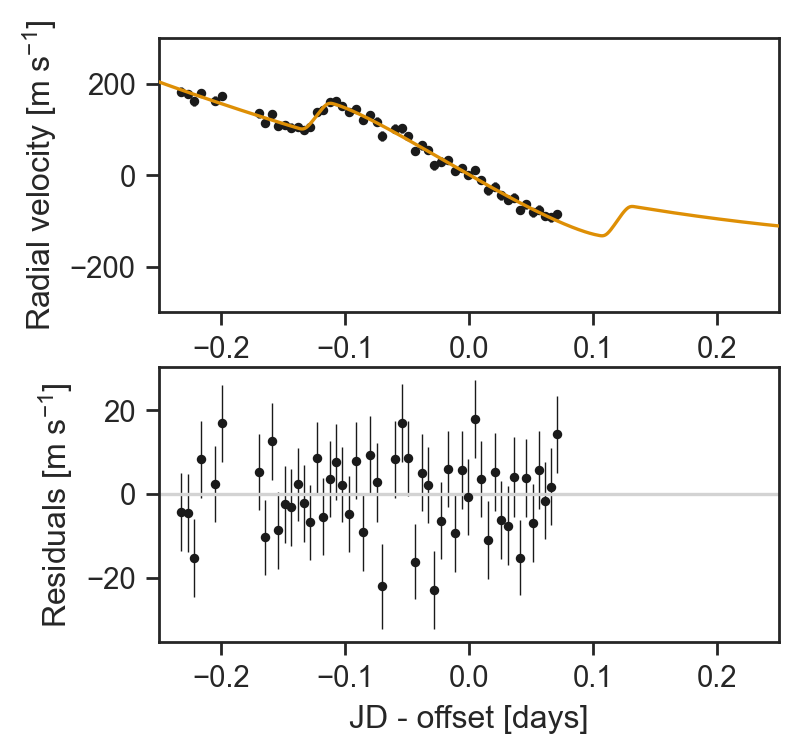

In [258]:
plot_rm_curve(map_soln_t0)

In [253]:
print(map_soln_t0['t0'])

0.0424426574070948


In [259]:
trace_t0 = sample_model(model_t0, start=map_soln_t0, tune=2500, draws=2000, chains=2, target_accept=0.95)

Sequential sampling (2 chains in 1 job)
NUTS: [c2, c1, c0, logs_rv, cosi_st, vsini, u_star, b, t0]
Sampling chain 1, 0 divergences: 100%|██████████| 4500/4500 [08:23<00:00,  8.94it/s]


Time elapsed: 17.481712086995444  minutes


In [261]:
_t0 = trace_t0["t0"]+time_offset
print(np.median(_t0), np.std(_t0))

2458781.0846041357 0.005477257288337229


Median RV exposure time [minutes]: nan


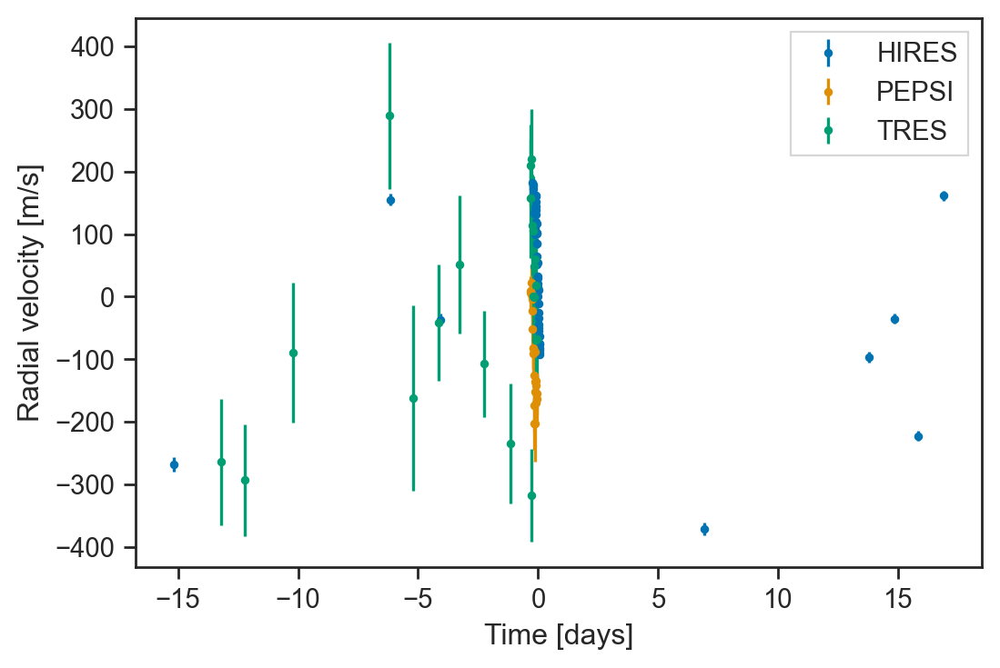

In [272]:
def get_rvs(instruments='all'):

    # Keck/HIRES radial velocities from California Planet Search
    hires = pd.read_csv('./data/epic210818897_rv_new.csv', comment='#')
    #x_rv = np.ascontiguousarray(data['bjd']-x_ref, dtype=np.float64)
    #y_rv = np.ascontiguousarray(data['mnvel'], dtype=np.float64)
    #yerr_rv = np.ascontiguousarray(data['errvel'], dtype=np.float64)
    hires['time'] = hires['bjd']-time_offset
    hires['rv'] = hires['mnvel']
    hires['err'] = hires['errvel']
    hires['inst_id'] = ['hires']*len(hires)
    hires_flag = np.zeros(len(hires), dtype=bool)

    # IRD radial velocities
    ird = pd.read_csv('./data/ird.csv', comment='#')
    ird['time'] = ird['time']-time_offset
    ird['rv'] = ird['mnvel']
    ird['err'] = ird['errvel']
    ird['inst_id'] = ['ird']*len(ird)
    ird_flag = np.zeros(len(ird), dtype=bool)

    # FLWO/TRES radial velocities from George Zhou
    # tres_bjd, tres_rv, tres_rverr, tres_vsini = np.genfromtxt('./data/EP210818897.dat', skip_header=1, unpack=True)
    # tres_time = tres_bjd-x_ref
    # tres_rv   = 1e3*(tres_rv-np.median(tres_rv))
    # tres_err  = 1e3*tres_rverr
    # tres_flag = np.ones(len(tres_bjd), dtype=bool)
    tres = pd.read_csv('./data/tres.csv')
    tres['time'] = tres['bjd_tdb']-time_offset
    tres['rv'] = 1e3*(tres['rv']-np.median(tres['rv']))
    tres['err'] = 1e3*tres['rverr']
    tres['inst_id'] = ['tres']*len(tres)
    tres_flag = np.ones(len(tres), dtype=bool)

    # PEPSI radial velocities from Ilya Ilin
    #pepsi = pd.read_csv('./data/pepsi.csv')
    #pepsi['bjd'] = [Time(str(ut), format='isot', scale='utc').jd for ut in pepsi['ut']]
    #pepsi['bjd'] += 0.5*15.0*u.minute.to(u.day) #double check this
    pepsi = pd.read_csv('./data/pepsi.csv')
    pepsi['bjd'] = pepsi['hjd_obs']
    pepsi['time'] = pepsi['bjd']-time_offset
    pepsi['chip'] = [fn[5] for fn in pepsi['filename']]
    pepsi['erv'] *= 2

    blue = pepsi['chip']=='b'
    red  = pepsi['chip']=='r'
    pepsi['inst_id'] = ['pepsi']*len(pepsi)

    # Compute average RV between the red and blue chips of PEPSI
    #pepsi_avgrv = np.mean([np.array(pepsi['rv'][red]), np.array(pepsi['rv'][blue])], axis=0)
    #pepsi_avgrverr = np.sqrt(np.array(pepsi['erv'][red])**2. + np.array(pepsi['erv'][blue])**2.)

    # Concatenate RVs
    if instruments=='all':
        x_rv = list(hires['time'])+list(tres['time'])+list(pepsi['time'][blue])
        y_rv = list(hires['mnvel'])+list(tres['rv'])+list(pepsi['rv'][blue])
        yerr_rv = list(hires['errvel'])+list(tres['err'])+list(pepsi['erv'][blue])
        inst_id = list(hires['inst_id'])+list(tres['inst_id'])+list(pepsi['inst_id'][blue])
    
    elif instruments=='hires':
        x_rv = list(hires['time'])
        y_rv = list(hires['mnvel'])
        yerr_rv = list(hires['errvel'])
        inst_id = list(hires['inst_id'])
        
    x_rv = np.ascontiguousarray(x_rv, dtype=np.float64)
    y_rv = np.ascontiguousarray(y_rv, dtype=np.float64)
    yerr_rv = np.ascontiguousarray(yerr_rv, dtype=np.float64)
    inst_id = np.ascontiguousarray(inst_id, dtype=str)

    # Restrict
    arg = abs(x_rv)<25
    x_rv = x_rv[arg]
    y_rv = y_rv[arg]
    yerr_rv = yerr_rv[arg]
    inst_id = inst_id[arg]
    
    # RVs must be sorted for GP modeling
    arg = np.argsort(x_rv)
    x_rv = x_rv[arg]
    y_rv = y_rv[arg]
    yerr_rv = yerr_rv[arg]
    inst_id = inst_id[arg]

    texp_rv = np.median(np.diff(x_rv[abs(x_rv-1719.18)<0.25]))
    print('Median RV exposure time [minutes]:', texp_rv*24.*60.)

    for inst in np.unique(inst_id):
        arg = inst_id == inst
        plt.errorbar(x_rv[arg], y_rv[arg], yerr=yerr_rv[arg], fmt=".", label=inst.upper())

    plt.xlabel("Time [days]")
    #plt.xlim(-25,25)
    plt.ylabel("Radial velocity [m/s]")
    plt.legend()
    plt.gcf().set_size_inches(6,4)
    plt.show()
    
    return x_rv, y_rv, yerr_rv, inst_id

_x_rv, _y_rv, _yerr_rv, _inst_id = get_rvs(instruments='all')

array([27.26422913, 25.12886477, 25.20608405, ..., 26.5570183 ,
       24.90065426, 26.20977236])

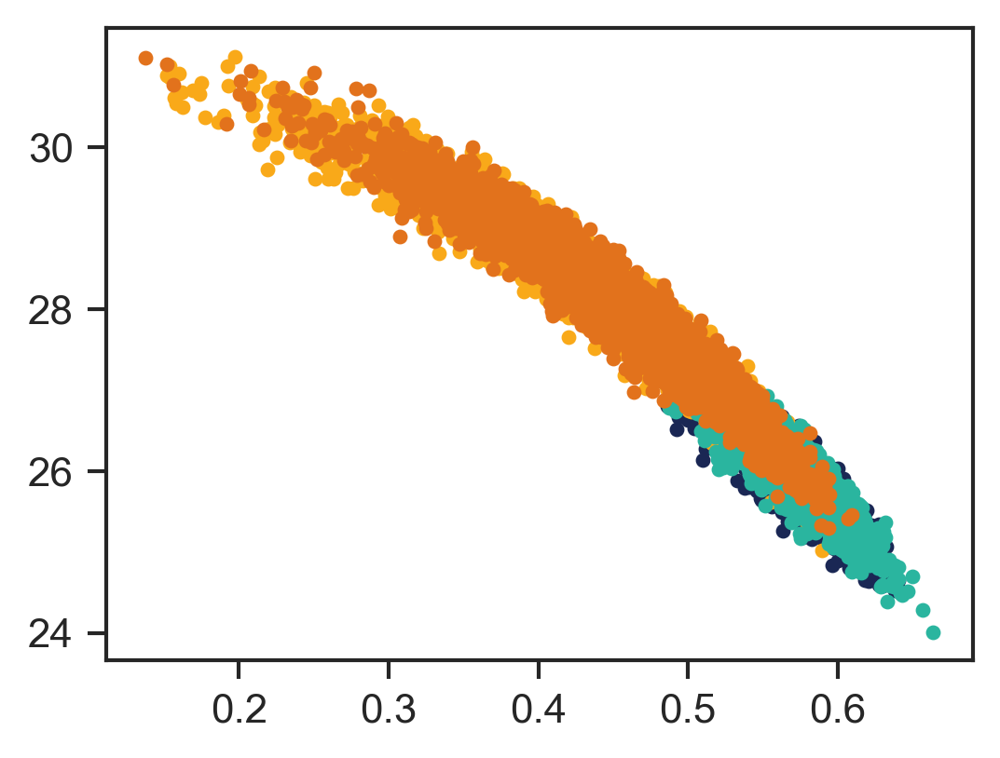

In [582]:
plt.scatter(trace_gp_protprio_hires['b'],
trace_gp_protprio_hires['a_r'])

plt.scatter(trace_gp_hires['b'],
trace_gp_hires['a_r'])

plt.scatter(trace_quad_protprio['b'],
trace_quad_protprio['a_r'])

plt.scatter(trace_quad['b'],
trace_quad['a_r'])

plt.show()

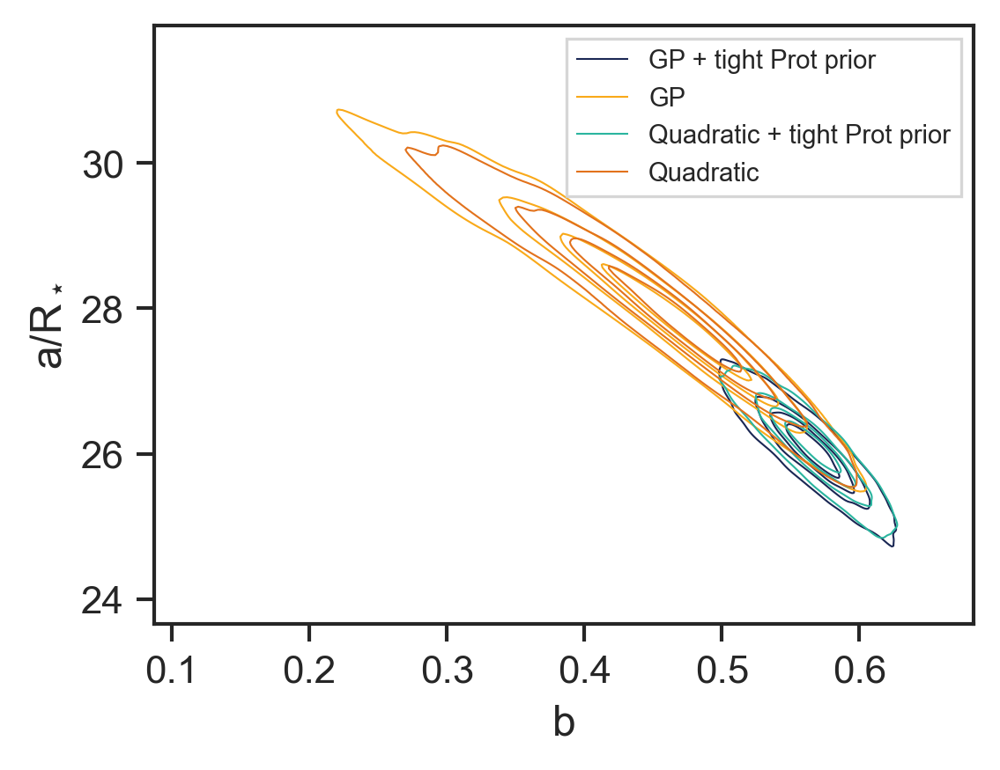

In [593]:
sns.kdeplot(x=trace_gp_protprio_hires["b"], y=trace_gp_protprio_hires["a_r"], label='GP + tight Prot prior', levels=5)
sns.kdeplot(x=trace_gp_hires["b"], y=trace_gp_hires["a_r"], label='GP', levels=5)
sns.kdeplot(x=trace_quad_protprio["b"], y=trace_quad_protprio["a_r"], label='Quadratic + tight Prot prior', levels=5)
sns.kdeplot(x=trace_quad["b"], y=trace_quad["a_r"], label='Quadratic', levels=5)
plt.legend(prop={'size':7})
plt.xlabel('b')
plt.ylabel('a/R$_\star$')
plt.show()

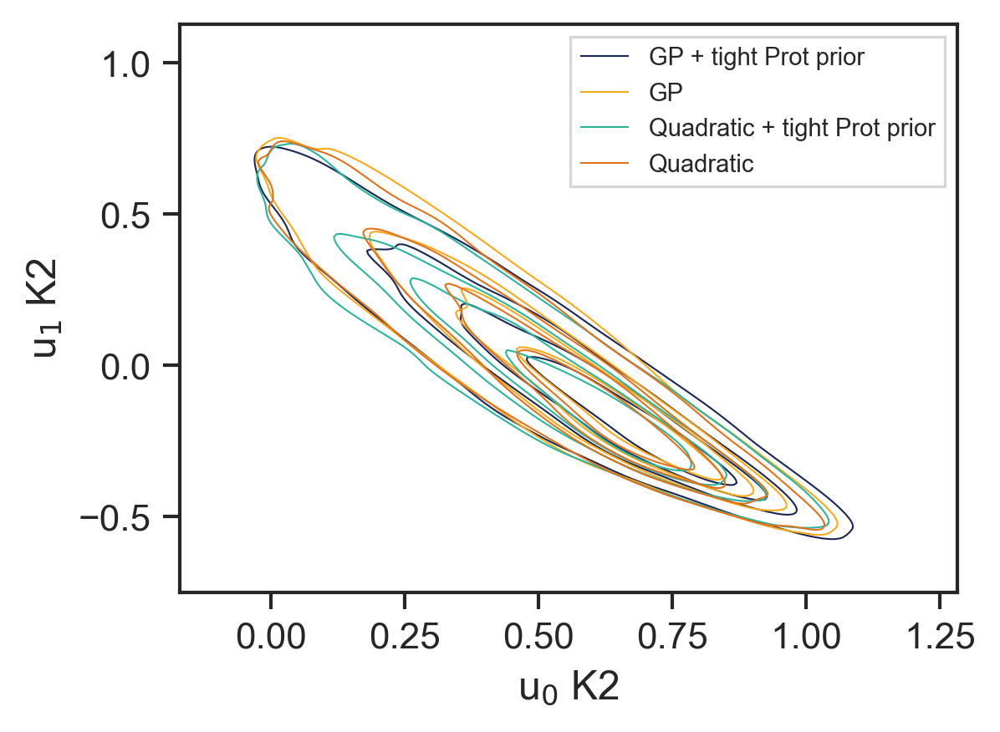

In [611]:
#_u0 = trace_gp_hires['u_star'][:,0]
#_u1 = trace_gp_hires['u_star'][:,1]

sns.kdeplot(x=trace_gp_protprio_hires['u_star'][:,0], y=trace_gp_protprio_hires['u_star'][:,1], label='GP + tight Prot prior', levels=5)
sns.kdeplot(x=trace_gp_hires['u_star'][:,0], y=trace_gp_hires['u_star'][:,1], label='GP', levels=5)
sns.kdeplot(x=trace_quad_protprio['u_star'][:,0], y=trace_quad_protprio['u_star'][:,1], label='Quadratic + tight Prot prior', levels=5)
sns.kdeplot(x=trace_quad['u_star'][:,0], y=trace_quad['u_star'][:,1], label='Quadratic', levels=5)
plt.legend(prop={'size':7})
plt.xlabel('u$_0$ K2')
plt.ylabel('u$_1$ K2')
plt.show()

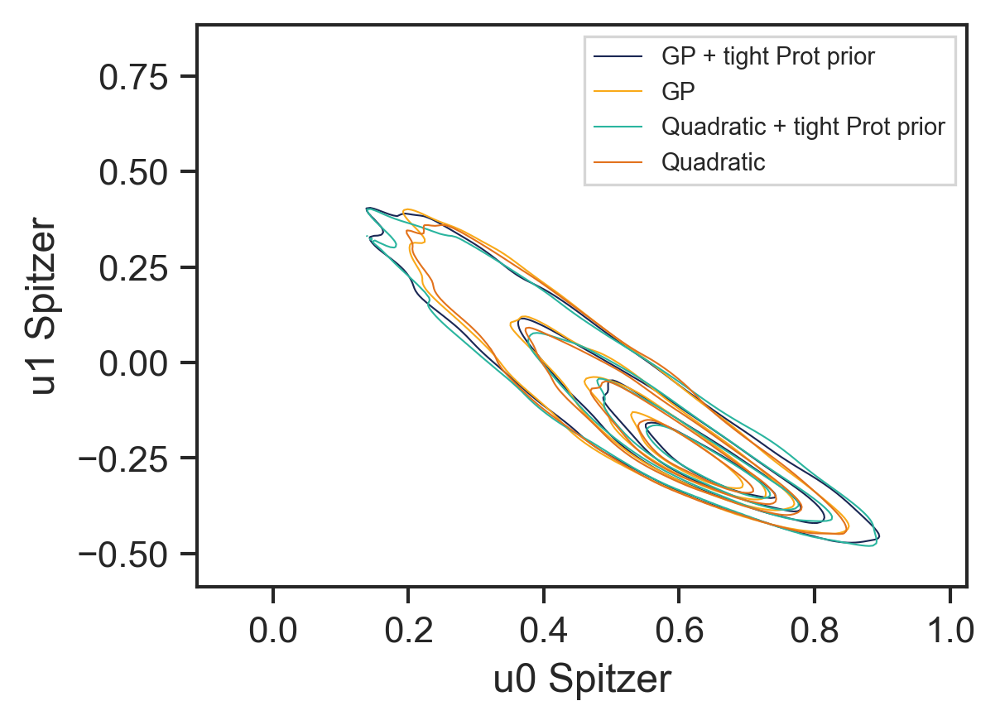

In [602]:
sns.kdeplot(x=trace_gp_protprio_hires['u_star_ir'][:,0], y=trace_gp_protprio_hires['u_star_ir'][:,1], label='GP + tight Prot prior', levels=5)
sns.kdeplot(x=trace_gp_hires['u_star_ir'][:,0], y=trace_gp_hires['u_star_ir'][:,1], label='GP', levels=5)
sns.kdeplot(x=trace_quad_protprio['u_star_ir'][:,0], y=trace_quad_protprio['u_star_ir'][:,1], label='Quadratic + tight Prot prior', levels=5)
sns.kdeplot(x=trace_quad['u_star_ir'][:,0], y=trace_quad['u_star_ir'][:,1], label='Quadratic', levels=5)
plt.legend(prop={'size':7})
plt.xlabel('u0 Spitzer')
plt.ylabel('u1 Spitzer')
plt.show()

In [616]:
labels = ['gp', 'gp_protprio', 'quad', 'quad_protprio']

for i,tr in enumerate([trace_gp_hires, 
           trace_gp_protprio_hires,
           trace_quad,
           trace_quad_protprio]):
    
    new_df = pd.DataFrame({'period': tr['period'],
                           't0': tr['t0']+time_offset,
                           'b': tr['b'],
                           'a_rstar': tr['a_r'],
                           'u0_ktwo': tr['u_star'][:,0],
                           'u1_ktwo': tr['u_star'][:,1],
                           'u0_spitzer': tr['u_star_ir'][:,0],
                           'u1_spitzer': tr['u_star_ir'][:,1],
                           'rp_rstar': tr['ror'],
                           'cosi_pl': tr['cosi_pl'],
                           'i_pl_deg': tr['i_pl_deg']})
    
    #new_df.head(3)
    new_df.to_csv('/Users/tdavid/Desktop/'+labels[i]+'.csv', index=False)
    
    print(labels[i])
    print(np.median(tr['b']), az.hdi(tr['b'], hdi_prob=0.68)-np.median(tr['b']))
    print(np.median(tr['a_r']), az.hdi(tr['a_r'], hdi_prob=0.68)-np.median(tr['a_r']))

gp
0.4538654240576969 [-0.06296115  0.07331911]
28.03178676150103 [-1.0449195   0.97004827]
gp_protprio
0.5649761055965363 [-0.02622345  0.02512141]
26.053681539775123 [-0.42358124  0.48453439]
quad
0.4582293160473945 [-0.06011445  0.06528575]
27.99166529235657 [-0.81172076  1.0885164 ]
quad_protprio
0.5657814778479955 [-0.02525643  0.02548321]
26.092207018108404 [-0.40742876  0.51448027]


,period,t0,b,a_rstar,u0_ktwo,u1_ktwo,u0_spitzer,u1_spitzer,rp_rstar,cosi_pl,i_pl_deg
0,24.141337,2.458781e+06,0.530945,26.476081,0.476307,0.120530,0.308000,0.212120,0.071121,0.020054,88.850928
1,24.141326,2.458781e+06,0.601585,25.517151,0.532911,-0.025093,0.598433,-0.211743,0.072150,0.023576,88.649086
2,24.141330,2.458781e+06,0.557271,26.098593,0.618212,-0.122264,0.740980,-0.336213,0.072491,0.021353,88.776497


In [605]:
trace_quad.varnames

['m_star_interval__',
 'r_star_interval__',
 'period',
 't0',
 'ror_interval__',
 'b_impact__',
 'u_star_quadlimbdark__',
 'u_star_ir_quadlimbdark__',
 'mean_ktwo',
 'mean_spitz',
 'logjit_spitz_interval__',
 'logjit_ktwo_interval__',
 'vsini_interval__',
 'cosi_st_interval__',
 'obliquity_rad_interval__',
 'logs_rv',
 'c0',
 'c1',
 'c2',
 'm_star',
 'r_star',
 'ror',
 'r_pl',
 'b',
 'u_star',
 'u_star_ir',
 'light_curves',
 'light_curve',
 'light_curves_spitz',
 'light_curve_spitz',
 'logjit_spitz',
 'jit_spitz',
 'err_spitz',
 'logjit_ktwo',
 'jit_ktwo',
 'err_ktwo',
 'vsini',
 'cosi_st',
 'sini_st',
 'i_st',
 'veq',
 'a_r',
 'cosi_pl',
 'i_pl_deg',
 'prot_model',
 'obliquity_rad',
 'obliquity',
 'rm_curve',
 'rm_curve_pred',
 'err_rv',
 'rv_trend',
 'rv_trend_pred',
 'rv_model',
 'rv_model_pred']

In [606]:
trace_quad['t0']

array([-0.00344598, -0.00502903, -0.00469845, ..., -0.00527933,
       -0.00504049, -0.00495014])